In [3]:
import numpy as np
import holotomo
import matplotlib.pyplot as plt
import tifffile
import cupy as cp
import holotomo
import glob
import dxchange
from ipywidgets import interact
import ipywidgets as widgets

PLANCK_CONSTANT = 4.135667696e-18  # [keV*s]
SPEED_OF_LIGHT = 299792458  # [m/s]

%matplotlib inline

cp.cuda.Device(0).use() # use first gpu

<CUDA Device 0>

In [8]:
n = 144 # data size after crop
npos = 16 # number of NFP positions
ndist = 1 # number of distanges
fileprefix = '/data/NSLSII/3ID/projection_image3/'

data0 = np.zeros([npos,ndist,n,n],dtype='float32')
ref0 = np.zeros([1,n,n],dtype='float32')
dark = np.zeros([1,n,n],dtype='float32')

for k in range(5*npos):    
    file = glob.glob(f'{fileprefix}/*{205+k}.tif')
    data0[k//5] += tifffile.imread(file[0])[780:780+n,278:278+n]

for k in range(5):
    file = glob.glob(f'{fileprefix}/*{285+k}.tif')
    dark += tifffile.imread(file[0])[780:780+n,278:278+n]

for k in range(5):
    file = glob.glob(f'{fileprefix}/*{200+k}.tif')
    ref0 += tifffile.imread(file[0])[780:780+n,278:278+n]

ref0-=dark
data0-=dark
ref0[ref0<0] = 0
data0[data0<0] = 0
rdata = (data0)/(ref0+1e-6)

def plot_rec(sid=1):
    plt.figure(figsize=(8,6))
    plt.imshow(rdata[sid,0],cmap='gray',vmax=2)    
    plt.colorbar()
interact(plot_rec, sid = widgets.IntSlider(value=0,
                                               min=0,
                                               max=rdata.shape[0]-1,
                                               step=1))    

interactive(children=(IntSlider(value=0, description='sid', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_rec(sid=1)>

# Init data sizes and parametes of the HXN of 3ID

In [77]:
voxelsize = 141.777e-9 # [m] object voxel size 
energy = 14  # [keV] x-ray energy    
wavelength = PLANCK_CONSTANT * SPEED_OF_LIGHT / energy # [m]
focusToDetectorDistance = 1.06 # [m]
z1 = np.array([2e-3])[:ndist] # positions of the sample (1 position is enough when using several codes)
z2 = focusToDetectorDistance-z1 # propagation distance between the code and detector
magnifications = (z1+z2)/z1 # magnification when propagating from the sample to the code
norm_magnifications = magnifications/magnifications[0] # normalized magnifications
distances = (z1*z2)/(z1+z2) # propagation distances after switching from the point source wave to plane wave,
distances = distances*norm_magnifications**2 # scaled propagation distances due to magnified probes

# Set motor shifts

In [1]:
shifts_motor = [[0.5,   2.3 ], [0.1,   2.8 ], [0.7, 2.4   ], [0.3,   2.1 ],                              
          [3.7, 0.3 ], [3.5, 0.7 ], [3.2, 0.4 ], [3.9, 0.9 ],
          [2.7,   2.2], [0.5,   5.1], [0.2, 5.5  ], [0.3,   5.8],
          [0.8, 5.4], [3.5, 5.3], [3.2, 5.8], [3.4, 5.5],
          ]
shifts_motor = np.array(shifts_motor)
# convert to pixels and shift to a middle
shifts = -shifts_motor[:,np.newaxis]/voxelsize*1e-6+np.array([32,58])

NameError: name 'np' is not defined

In [92]:
data0[4] =data0[3].copy()
rdata[4] = rdata[3].copy() 
shifts[4]=shifts[3].copy()

# Apply shifts to normalized data

1


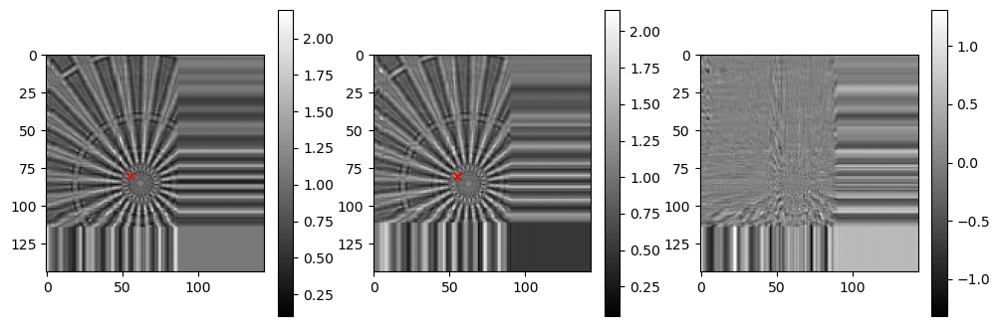

2


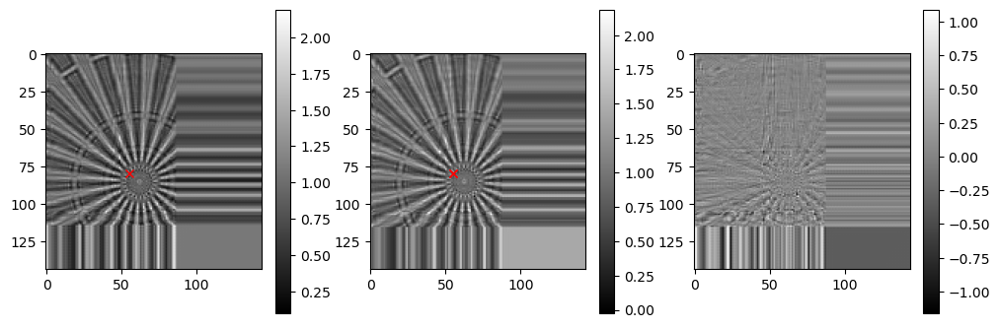

3


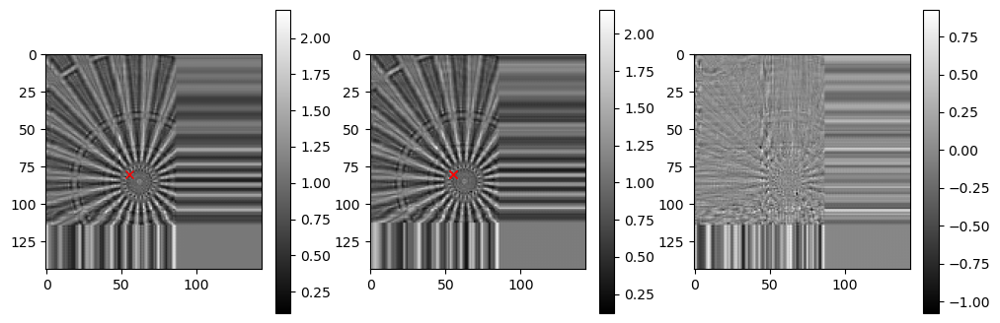

4


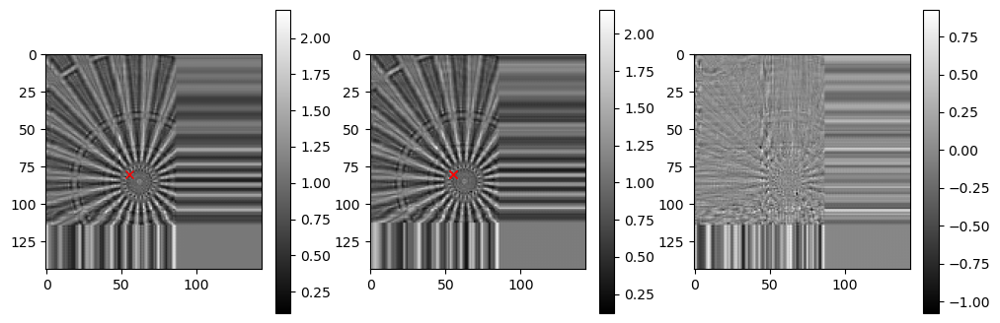

5


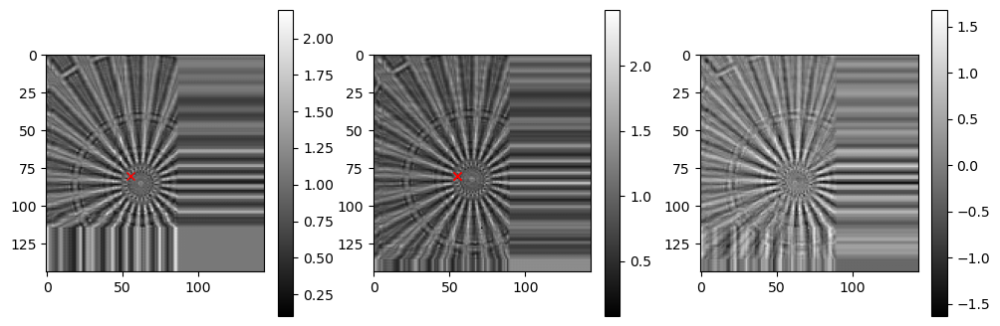

6


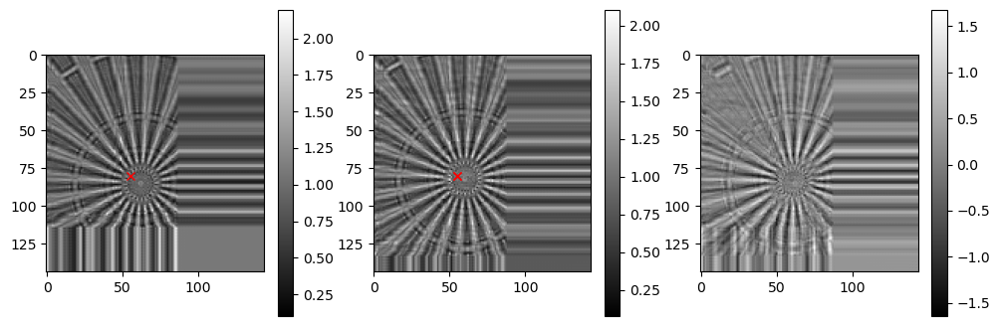

7


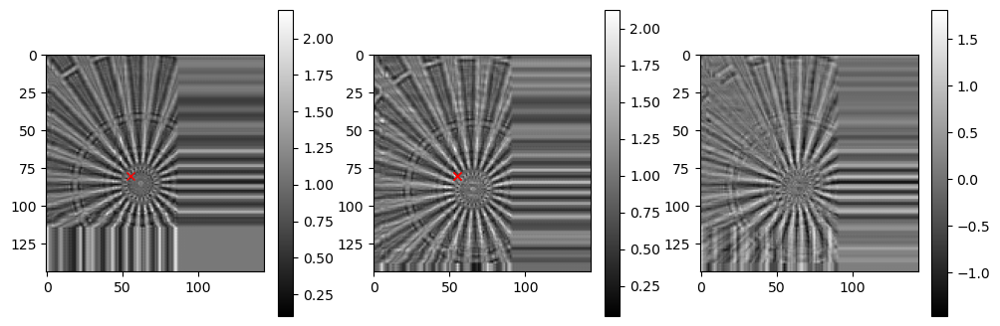

8


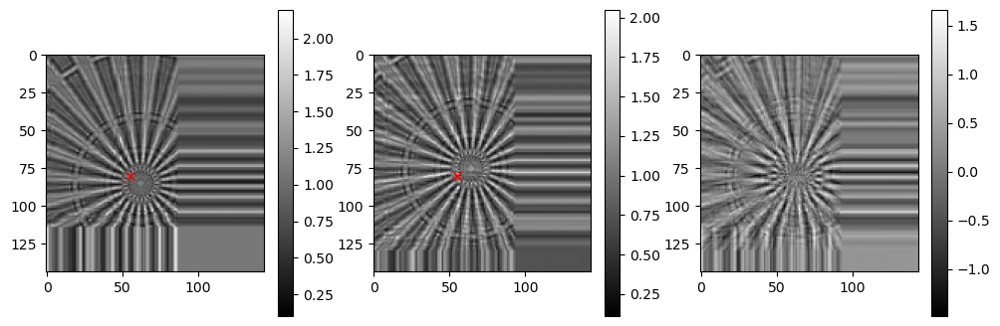

9


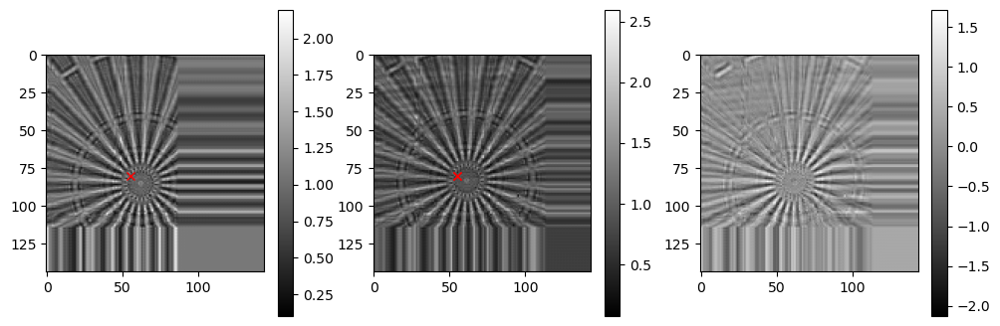

10


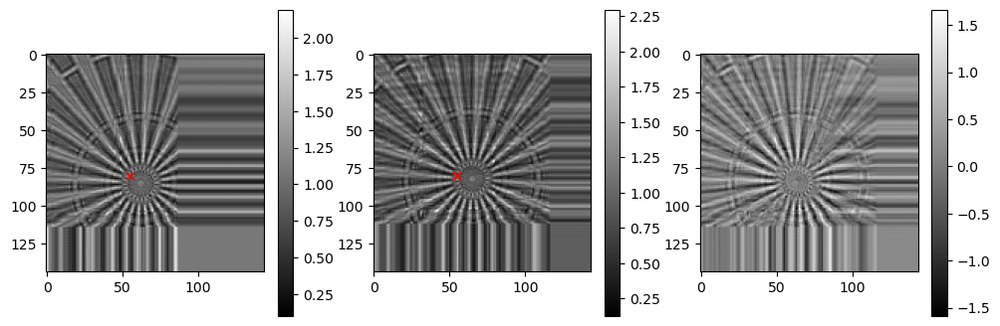

11


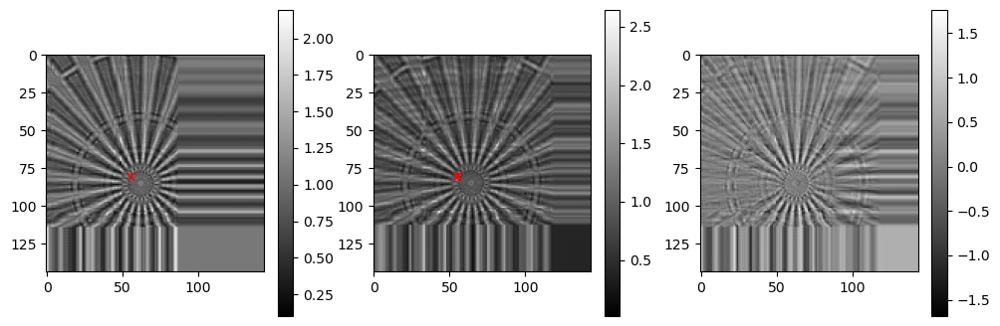

12


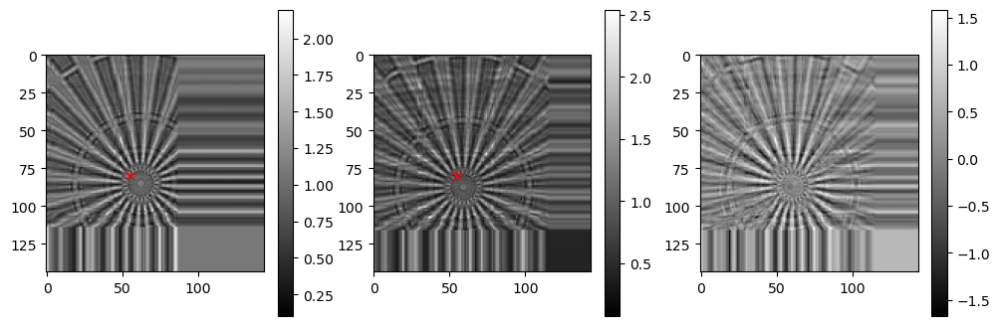

13


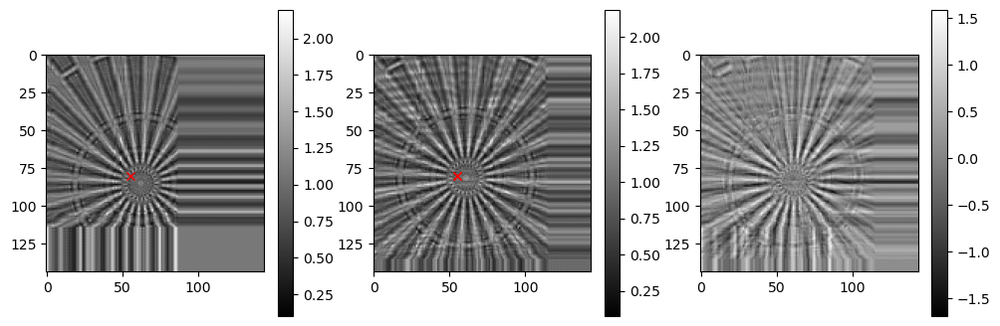

14


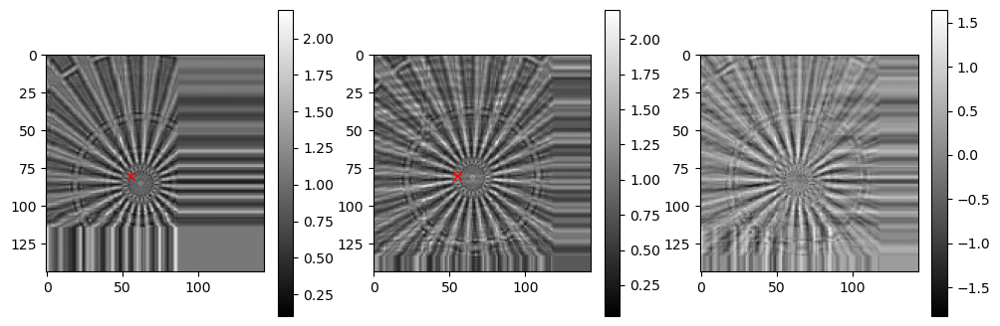

15


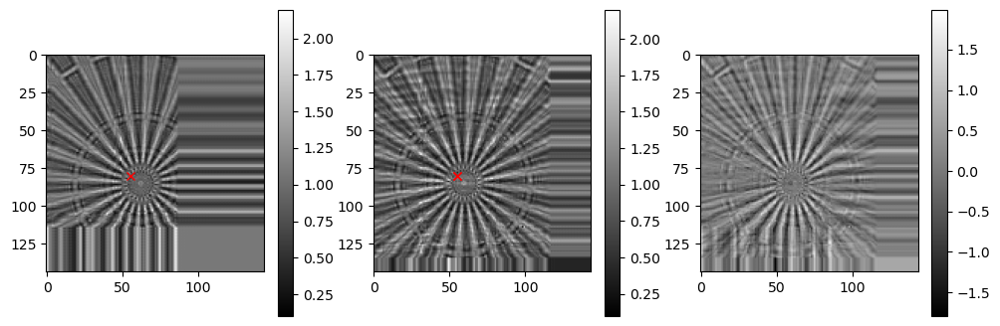

In [93]:
def apply_shift(psi, p):
    """Apply shift for all projections."""
    psi = cp.array(psi)
    p = cp.array(p)
    tmp = cp.pad(psi,((0,0),(n//2,n//2),(n//2,n//2)), 'edge')
    [x, y] = cp.meshgrid(cp.fft.rfftfreq(2*n),
                         cp.fft.fftfreq(2*n))
                         
    shift = cp.exp(-2*cp.pi*1j *
                   (x*p[:, 1, None, None]+y*p[:, 0, None, None]))
    res0 = cp.fft.irfft2(shift*cp.fft.rfft2(tmp))
    res = res0[:, n//2:3*n//2, n//2:3*n//2].get()
    return res

rdata_new = rdata.copy()    
for k in range(ndist):
    for j in range(npos):        
        rdata_new[j,k:k+1] = apply_shift(rdata[j,k:k+1],-shifts[j,k:k+1])

for k in range(1,npos):
    # fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    # im=axs[0].imshow(rdata[0,0],cmap='gray')
    # axs[0].plot(55,80,'rx')        
    # fig.colorbar(im)
    # im=axs[1].imshow(rdata[k,0],cmap='gray')
    # axs[1].plot(55,80,'rx')        
    # fig.colorbar(im)        
    print(k)
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))    
    im=axs[0].imshow(rdata_new[0,0],cmap='gray' )
    axs[0].plot(55,80,'rx')    
    fig.colorbar(im)        
    im=axs[1].imshow(rdata_new[k,0],cmap='gray' )
    axs[1].plot(55,80,'rx')
    fig.colorbar(im)            
    im=axs[2].imshow(rdata_new[0,0]-rdata_new[k,0],cmap='gray' )
    axs[1].plot(55,80,'rx')    
    fig.colorbar(im)     
    plt.show()   
    

In [95]:
rdata_new_crop = rdata_new[:,:,64-32+16:64+32+16,64-32:64+32]
def plot_rec(sid=1):
    plt.figure(figsize=(8,6))
    plt.imshow(rdata_new_crop[sid,0],cmap='gray',vmax=2)    
    plt.colorbar()
interact(plot_rec, sid = widgets.IntSlider(value=0,
                                               min=0,
                                               max=rdata_new.shape[0]-1,
                                               step=1))    

interactive(children=(IntSlider(value=0, description='sid', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_rec(sid=1)>

# find shifts accurately

In [96]:
def _upsampled_dft(data, ups,
                   upsample_factor=1, axis_offsets=None):

    im2pi = 1j * 2 * np.pi
    tdata = data.copy()
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 1:2])[
        :, :, None]*np.fft.fftfreq(data.shape[2], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    tdata = np.einsum('ijk,ipk->ijp', kernel, tdata)
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 0:1])[
        :, :, None]*np.fft.fftfreq(data.shape[1], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    rec = np.einsum('ijk,ipk->ijp', kernel, tdata)

    return rec

def registration_shift(src_image, target_image, upsample_factor=1, space="real"):

    # assume complex data is already in Fourier space
    if space.lower() == 'fourier':
        src_freq = src_image
        target_freq = target_image
    # real data needs to be fft'd.
    elif space.lower() == 'real':
        src_freq = np.fft.fft2(src_image)
        target_freq = np.fft.fft2(target_image)

    # Whole-pixel shift - Compute cross-correlation by an IFFT
    shape = src_freq.shape
    image_product = src_freq * target_freq.conj()
    cross_correlation = np.fft.ifft2(image_product)
    A = np.abs(cross_correlation)
    maxima = A.reshape(A.shape[0], -1).argmax(1)
    maxima = np.column_stack(np.unravel_index(maxima, A[0, :, :].shape))

    midpoints = np.array([np.fix(axis_size / 2)
                          for axis_size in shape[1:]])

    shifts = np.array(maxima, dtype=np.float64)
    ids = np.where(shifts[:, 0] > midpoints[0])
    shifts[ids[0], 0] -= shape[1]
    ids = np.where(shifts[:, 1] > midpoints[1])
    shifts[ids[0], 1] -= shape[2]
    
    if upsample_factor > 1:
        # Initial shift estimate in upsampled grid
        shifts = np.round(shifts * upsample_factor) / upsample_factor
        upsampled_region_size = np.ceil(upsample_factor * 1.5)
        # Center of output array at dftshift + 1
        dftshift = np.fix(upsampled_region_size / 2.0)

        normalization = (src_freq[0].size * upsample_factor ** 2)
        # Matrix multiply DFT around the current shift estimate

        sample_region_offset = dftshift - shifts*upsample_factor
        cross_correlation = _upsampled_dft(image_product.conj(),
                                                upsampled_region_size,
                                                upsample_factor,
                                                sample_region_offset).conj()
        cross_correlation /= normalization
        # Locate maximum and map back to original pixel grid
        A = np.abs(cross_correlation)
        maxima = A.reshape(A.shape[0], -1).argmax(1)
        maxima = np.column_stack(
            np.unravel_index(maxima, A[0, :, :].shape))

        maxima = np.array(maxima, dtype=np.float64) - dftshift

        shifts = shifts + maxima / upsample_factor
           
    return shifts

shifts_adjust = shifts.copy()
for k in range(rdata_new.shape[0]):    
    for j in range(ndist):
        shifts_adjust[k,j] = registration_shift(rdata_new[k,j:j+1,:,8:-8],rdata_new[0,j:j+1,:,8:-8],upsample_factor=100)
        print(shifts[k,j],shifts_adjust[k,j])
        
rdata_new_shifted = rdata_new.copy()
for k in range(rdata_new.shape[0]):   
    for j in range(ndist): 
    # print(f'shift for pos {k} dist {j} is {shifts[k,j]}')
        rdata_new_shifted[k,j:j+1] = apply_shift(rdata_new[k,j:j+1],-shifts_adjust[k,j:j+1])

[28.47333489 55.88400093] [0. 0.]
[31.29466698 52.35733582] [ 0.07 -0.05]
[27.06266884 55.17866791] [-0.29  0.02]
[29.88400093 57.29466698] [-0.25 -0.01]
[29.88400093 57.29466698] [-0.25 -0.01]
[ 7.3133442  53.06266884] [-2.72  2.28]
[ 9.42934326 55.17866791] [-3.4  -2.69]
[ 4.4920121  51.65200279] [3.58 3.04]
[12.95600838 49.53600372] [-10.     1.45]
[28.47333489 29.08134606] [-2.27 -1.23]
[30.58933395 26.26001397] [-3.08  2.39]
[29.88400093 24.1440149 ] [-0.26  1.64]
[26.35733582 26.96534699] [ 2.42 -3.36]
[ 7.3133442  27.67068001] [-4.   -1.73]
[ 9.42934326 24.1440149 ] [-4.04  2.56]
[ 8.01867722 26.26001397] [-0.51 -3.11]


In [97]:
def plot_rec(sid=1):
    plt.figure(figsize=(8,6))
    plt.imshow(rdata_new_shifted[sid,0],cmap='gray',vmax=2)    
    plt.colorbar()
interact(plot_rec, sid = widgets.IntSlider(value=0,
                                               min=0,
                                               max=rdata_new_shifted.shape[0]-1,
                                               step=1))    

interactive(children=(IntSlider(value=0, description='sid', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_rec(sid=1)>

# apply shifts to initial data

In [98]:
rdata_new = rdata.copy()    
shifts_new = shifts+shifts_adjust
for k in range(ndist):
    for j in range(npos):
        #print(f'shift for pos {k} dist {j} is {shifts[k,j]}')
        rdata_new[j,k:k+1] = apply_shift(rdata[j,k:k+1],-shifts_new[j,k:k+1])
def plot_rec(sid=1):
    plt.figure(figsize=(8,6))
    plt.imshow(rdata_new[sid,0],cmap='gray',vmax=2)    
    plt.colorbar()
interact(plot_rec, sid = widgets.IntSlider(value=0,
                                               min=0,
                                               max=rdata_new.shape[0]-1,
                                               step=1))    


interactive(children=(IntSlider(value=0, description='sid', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_rec(sid=1)>

# set data and flat field for reconstruction

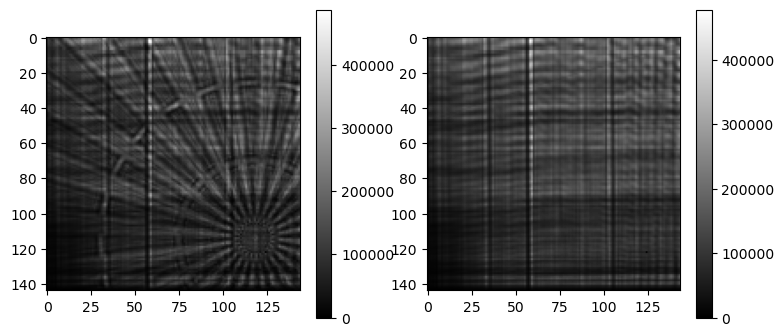

In [99]:
data = data0[:,:,np.newaxis]# adding angular dim
ref = ref0.copy()
for k in range(ndist):
    fig, axs = plt.subplots(1, 2, figsize=(9, 4))
    im=axs[0].imshow(data[0,k,0],cmap='gray')
    fig.colorbar(im)
    im=axs[1].imshow(ref[k],cmap='gray')
    fig.colorbar(im)        
    

# Create solver class

In [100]:
pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances[0:1], norm_magnifications[0:1]) 

## Goal: recover the sample and probe simultaneously $\ \sum_i\sum_j||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi,q}$ 

$i$ - index for the NFP shifts\
$j$ - index for planes \
$\psi$ - sample at plane 0 \
$q$ - probe at plane 0\
$M_j$ - object normalized (de-)magnification for the plane $j$ \
$S_r$ - shift for distance r (x and y), NFP shifts + alignment shifts \
$\mathcal{G}_d$ - Fresnel transform for distance $d$

## Holotomography can be obtained by associating index $i$ with angles (no NFP)
## $\sum_i\sum_j||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi_i))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi_i,q} $

## Define forward operators as 
### $\psi \to \mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_jS_{r_{ij}}\psi))$, where $i = 0 \dots 15$, $j = 0 \dots 3$ 
### $q \to \mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_jS_{r_{ij}}\psi))$, where $i = 0 \dots 15$, $j = 0 \dots 3$, 
## The adjoint operators are then 
### $\sigma[\psi]\to \sum_j\sum_i M_j^*S_{-r_{ij}}((\mathcal{G}_{d'_j}q)^*\mathcal{G}_{-d_{j}}\sigma)$, 
### $\sigma[q]\to \sum_j\sum_i \mathcal{G}_{-d'_j}((M_jS_{r_{ij}}\psi)^*\mathcal{G}_{-d_j}\sigma)$

# Adjoint test for holography with double propagation

In [101]:
arr1 = cp.pad(cp.array(data[0,0]+1j*data[0,0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = cp.array(ref[:1]+1j*ref[:1]).astype('complex64')
print(arr1.shape)
print(prb1.shape)
arr2 = pslv.fwd_holo(arr1,prb1)
arr3 = pslv.adj_holo(arr2,prb1)
prb3 = pslv.adj_holo_prb(arr2,arr1)


print(cp.sum(arr1*cp.conj(arr3)))
print(cp.sum(arr2*cp.conj(arr2)))
print(cp.sum(prb1*cp.conj(prb3)))

(1, 288, 288)
(1, 144, 144)
(2.3983647e+25+1.2119047e+18j)
(2.398365e+25-944322850000000j)
(2.3983652e+25+2.543078e+17j)


In [102]:
def fwd_nfp(pslv,psi,prb,shifts):
    fpsi = cp.zeros([shifts.shape[0],shifts.shape[1],1,n,n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        fpsi[j] = pslv.fwd_holo(psi,prb,shifts[j])                      
    return fpsi

def adj_nfp(pslv,fpsi,prb,shifts):
    psi = cp.zeros([1,2*n,2*n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        psi += pslv.adj_holo(fpsi[j],prb,shifts[j])                                   
    return psi

def adj_nfp_prb(pslv,fprb,psi,shifts):
    prb = cp.zeros([1,n,n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        prb += pslv.adj_holo_prb(fprb[j],psi,shifts[j])           
    return prb

# Adjoint test

In [103]:
shifts = cp.array(shifts)
arr1 = cp.pad(cp.array(data[0,0]+1j*data[0,0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = cp.array(ref[:1]+1j*ref[:1]).astype('complex64')
arr2 = fwd_nfp(pslv,arr1,prb1,shifts)
arr3 = adj_nfp(pslv,arr2,prb1,shifts)
prb3 = adj_nfp_prb(pslv,arr2,arr1,shifts)

print(cp.sum(arr1*cp.conj(arr3)))
print(cp.sum(arr2*cp.conj(arr2)))
print(cp.sum(prb1*cp.conj(prb3)))

(2.7061971e+26+2.1600812e+19j)
(2.7061973e+26-1.1437732e+16j)
(2.7061971e+26+2.6798908e+18j)


## Gradient descent with the line search

In [104]:
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while(minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if(gamma <= 1e-12):  # direction not found
        #print('no direction')
        gamma = 0
    return gamma
    
def cg_holo(pslv, data, init, init_prb,  piter,shifts, upd_psi=True, upd_prb=False,step=1):
    """Conjugate gradients method for holography"""

    # minimization functional
    def minf(fpsi):
        f = cp.linalg.norm(cp.abs(fpsi)-cp.sqrt(data))**2            
        # f = cp.linalg.norm(cp.abs(fpsi)**2-data)**2            
        return f        
    psi = init.copy()
    prb = init_prb.copy()
    
    for i in range(piter):
        if upd_psi:
            
            fpsi = fwd_nfp(pslv,psi,prb,shifts)            
            grad = adj_nfp(pslv,
               fpsi-cp.sqrt(data)*cp.exp(1j*cp.angle(fpsi)), prb,shifts)/cp.max(cp.abs(prb))**2/ndist**2
                    
            d = -grad    
            # line search
            fd = fwd_nfp(pslv, d, prb,shifts)
            gammapsi = line_search(minf, 1, fpsi, fd)
            psi = psi+gammapsi*d
            
            if i%step==0:
                fig, axs = plt.subplots(2, 2, figsize=(8, 8))
                im=axs[0,0].imshow(np.abs(psi[0].get()),cmap='gray')
                axs[0,0].set_title('reconstructed amplitude')
                fig.colorbar(im)
                im=axs[0,1].imshow(np.abs(psi[0,n//2+n//4:-n//2-n//4,n//2+n//4:-n//2-n//4].get()),cmap='gray')
                axs[0,1].set_title('reconstructed amplitude scaled')
                fig.colorbar(im)
                im=axs[1,0].imshow(np.angle(psi[0].get()),cmap='gray')
                axs[1,0].set_title('reconstructed phase')
                fig.colorbar(im)
                im=axs[1,1].imshow(np.angle(psi[0,n//2+n//4:-n//2-n//4,n//2+n//4:-n//2-n//4].get()),cmap='gray')
                axs[1,1].set_title('reconstructed phase scaled')
                fig.colorbar(im)
                plt.show()
                fpsi = fwd_nfp(pslv,psi,prb,shifts)                            
                err=minf(fpsi)            
                print(f'{i}) {gammapsi=}, {err=:1.5e}')   
                dxchange.write_tiff(cp.angle(psi).get(),f'/data/vnikitin/holo/NSLSII/proj2/r{n}_{npos}/r{i:05}.tiff',overwrite=True)
                dxchange.write_tiff(cp.angle(prb).get(),f'/data/vnikitin/holo/NSLSII/proj2/p{n}_{npos}/r{i:05}.tiff',overwrite=True)
             
           
        if upd_prb:
            fprb = fwd_nfp(pslv,psi,prb,shifts)
            gradprb = adj_nfp_prb(pslv,fprb-cp.sqrt(data)*cp.exp(1j*cp.angle(fprb)),psi,shifts)/cp.max(cp.abs(psi))**2/pslv.ntheta/ndist**2

            dprb = -gradprb
            # gradprb0 = gradprb
            # line search
            fdprb = fwd_nfp(pslv,psi, dprb,shifts)
            gammaprb = line_search(minf, 1, fprb, fdprb)
            prb = prb + gammaprb*dprb
            
            if i%step==0:
                fprb = fwd_nfp(pslv,psi,prb,shifts)
                err=minf(fprb)
                print(f'{i}) {gammaprb=}, {err=:1.5e}')    
        
    return psi,prb

def cg_holo_batch(pslv, data, init, prb_init, piter,shifts=None,upd_psi=True,upd_prb=False,step=1):
    """Batch of CG solvers"""
    
    res = np.zeros([pslv.ntheta, 2*pslv.n, 2*pslv.n], dtype='complex64')
    prb_init_gpu = cp.array(prb_init)                
    for ids in holotomo.utils.chunk(range(pslv.ntheta), pslv.ptheta):
        # copy data part to gpu
        data_gpu = cp.array(data[:,:,ids])
        init_gpu = cp.array(init[ids])
        
        # Radon transform
        res_gpu,res_prb_gpu = cg_holo(pslv, data_gpu, init_gpu,prb_init_gpu, piter,shifts,upd_psi, upd_prb,step)
        # copy result to cpu
        res[ids] = res_gpu.get()
        res_prb = res_prb_gpu.get()
    return res,res_prb



# Estimate probe using one reference image $\||\mathcal{G}_{d_0}q|-\sqrt{\text{I}_{r_0}}\|^2_2\to \text{min}$, taken for distance 0


(1, 1, 1, 144, 144)
0) gammaprb=1, err=2.38161e-03
8) gammaprb=1, err=5.17163e-05
16) gammaprb=1, err=5.37887e-05
24) gammaprb=1, err=5.45318e-05


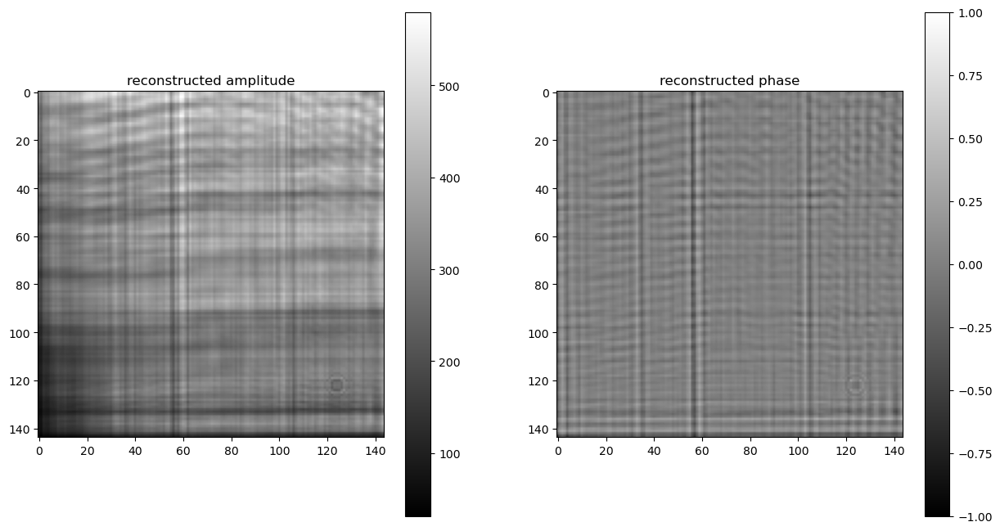

In [105]:
rec = np.ones([1,2*n,2*n],dtype='complex64')
rec_prb = np.ones([1,n,n],dtype='complex64')        
data_ref = ref[:1,np.newaxis,np.newaxis]
print(data_ref.shape)
shifts_ref = (shifts/cp.array(norm_magnifications[:,np.newaxis]))[:1,:1]*0
pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances[:1], norm_magnifications[:1]) 
_,rec_prb0 = cg_holo_batch(pslv, data_ref, rec, rec_prb, 32, shifts_ref, False,True,8)

fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec_prb0[0]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec_prb0[0]),cmap='gray',vmin=-1,vmax=1)
axs[1].set_title('reconstructed phase')
fig.colorbar(im)


## $\ \sum_j\sum_i||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi,q}$ 

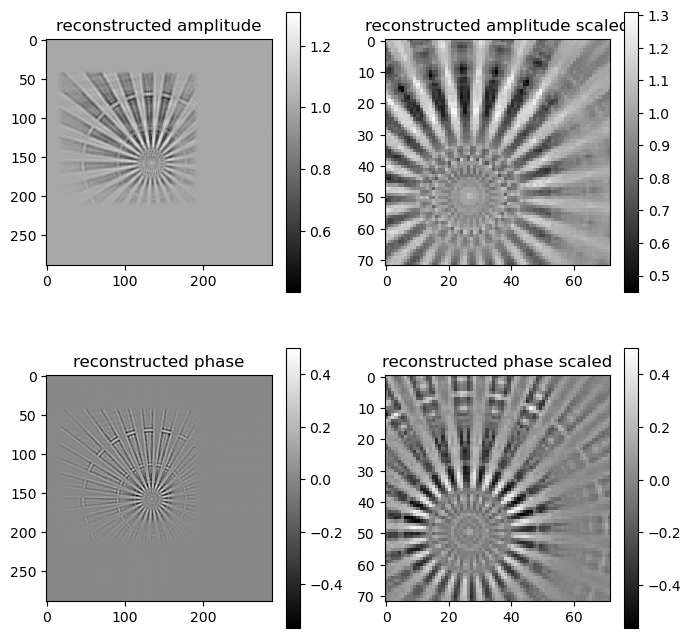

0) gammapsi=0.25, err=2.23533e+08
0) gammaprb=0.125, err=1.75361e+08


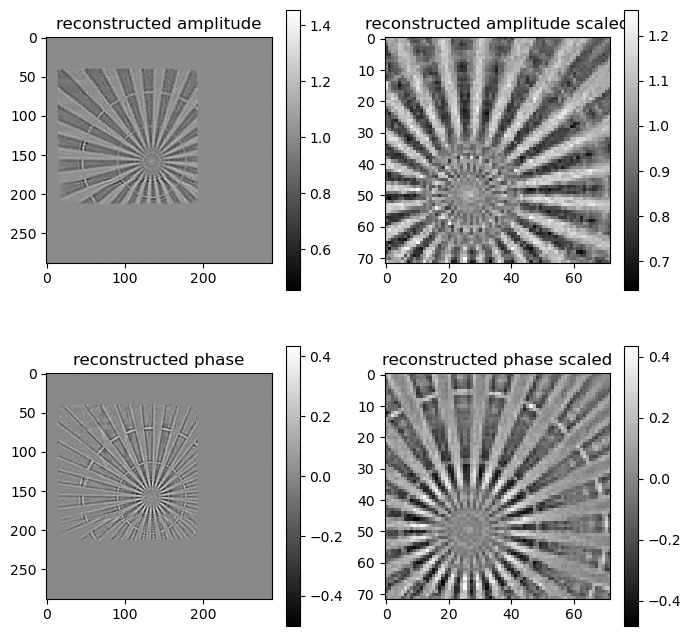

32) gammapsi=0.5, err=4.20289e+07
32) gammaprb=0.25, err=4.18545e+07


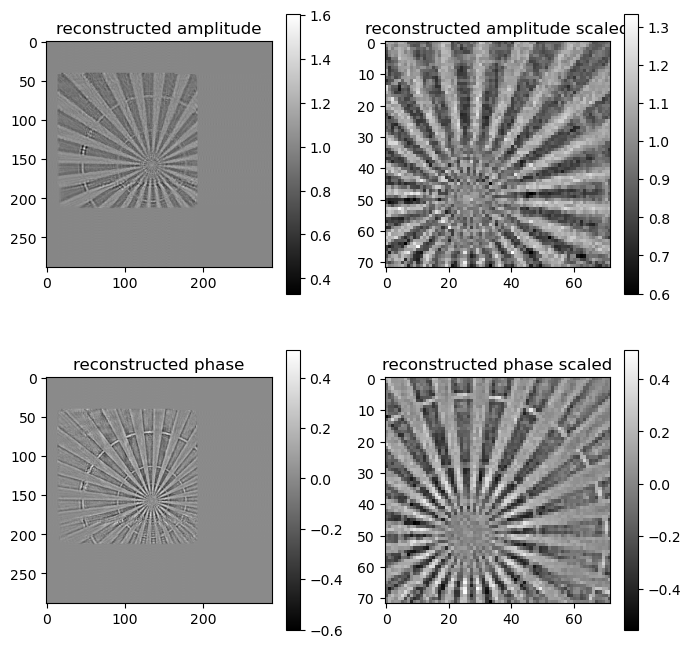

64) gammapsi=0.5, err=3.49140e+07
64) gammaprb=0.5, err=3.48586e+07


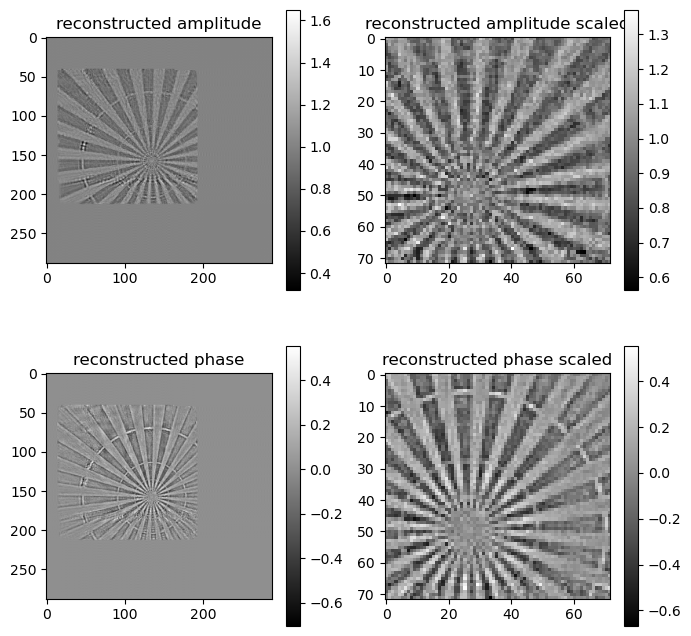

96) gammapsi=0.5, err=3.17914e+07
96) gammaprb=0.5, err=3.17583e+07


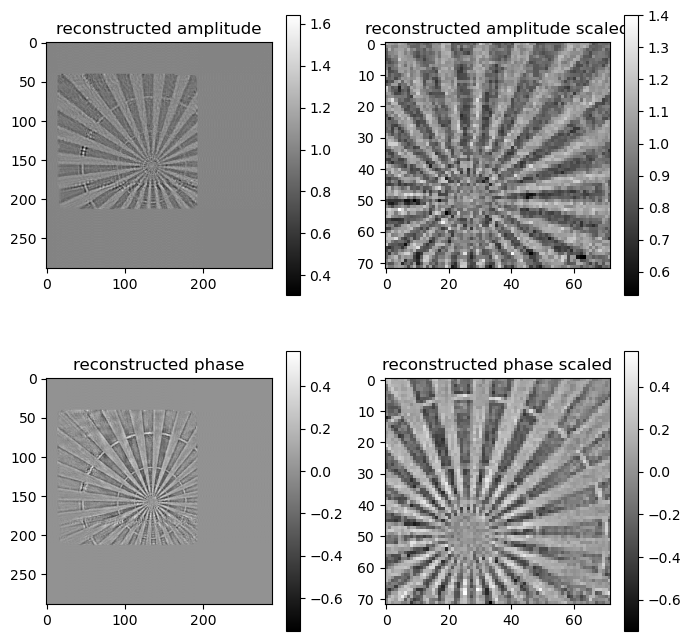

128) gammapsi=0.25, err=2.99776e+07
128) gammaprb=0.5, err=2.99717e+07


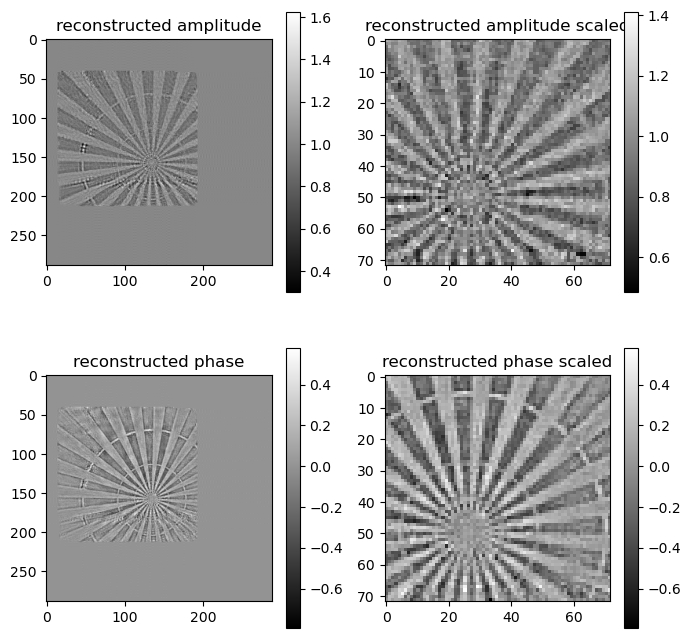

160) gammapsi=0.5, err=2.87331e+07
160) gammaprb=0.25, err=2.87083e+07


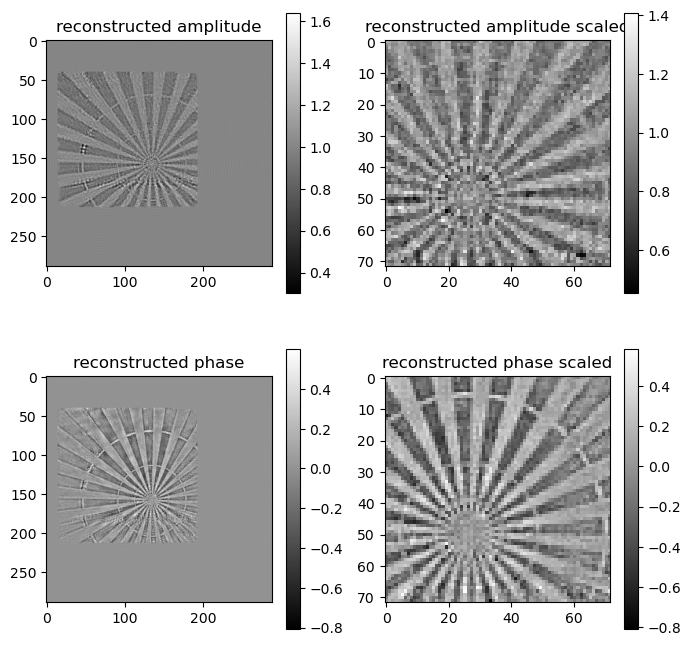

192) gammapsi=0.25, err=2.77869e+07
192) gammaprb=0.5, err=2.77748e+07


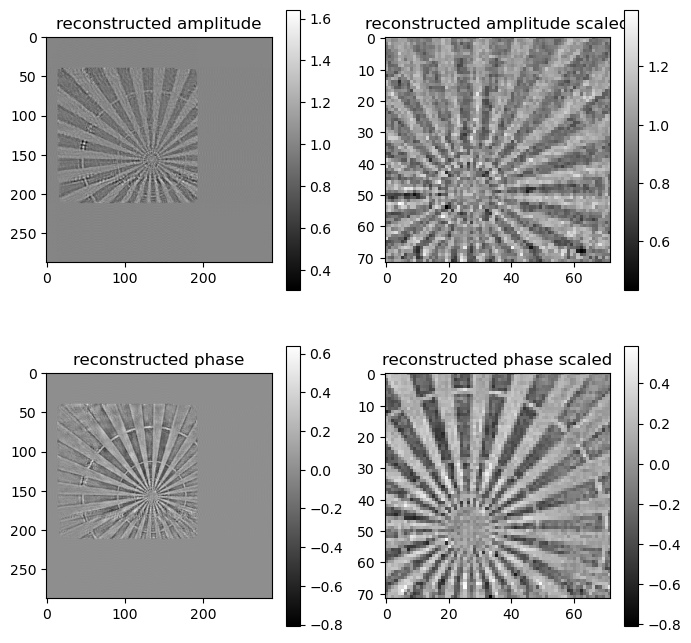

224) gammapsi=0.5, err=2.70671e+07
224) gammaprb=0.25, err=2.70476e+07


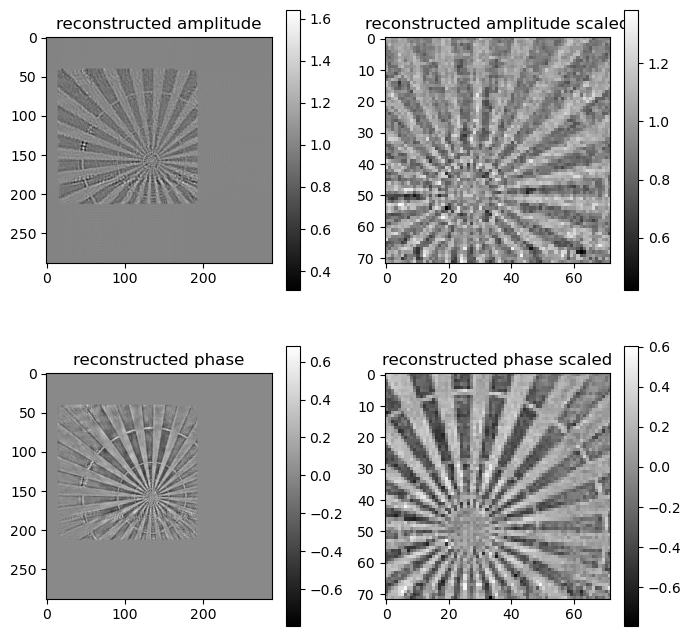

256) gammapsi=0.5, err=2.64475e+07
256) gammaprb=0.5, err=2.64441e+07


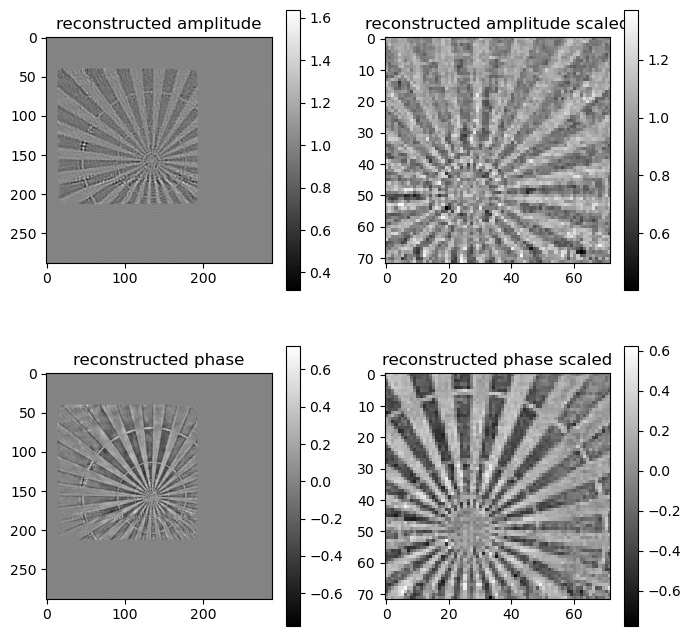

288) gammapsi=0.25, err=2.59184e+07
288) gammaprb=0.5, err=2.59175e+07


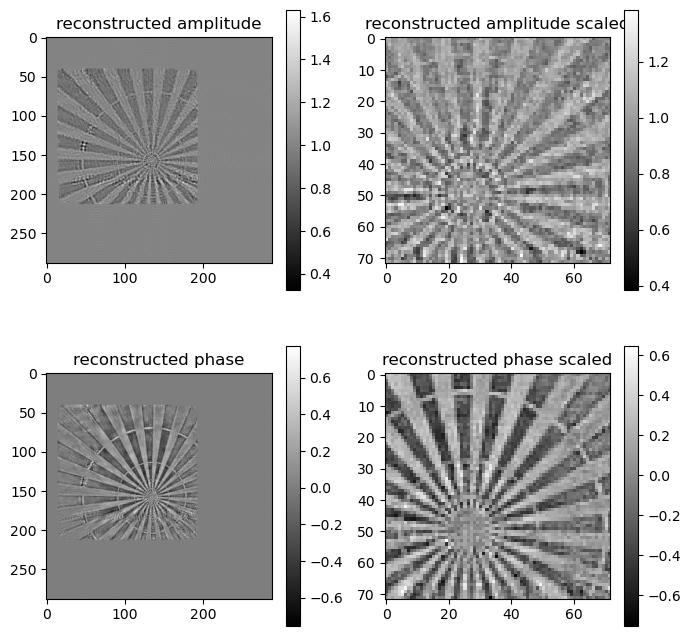

320) gammapsi=0.25, err=2.54689e+07
320) gammaprb=0.5, err=2.54638e+07


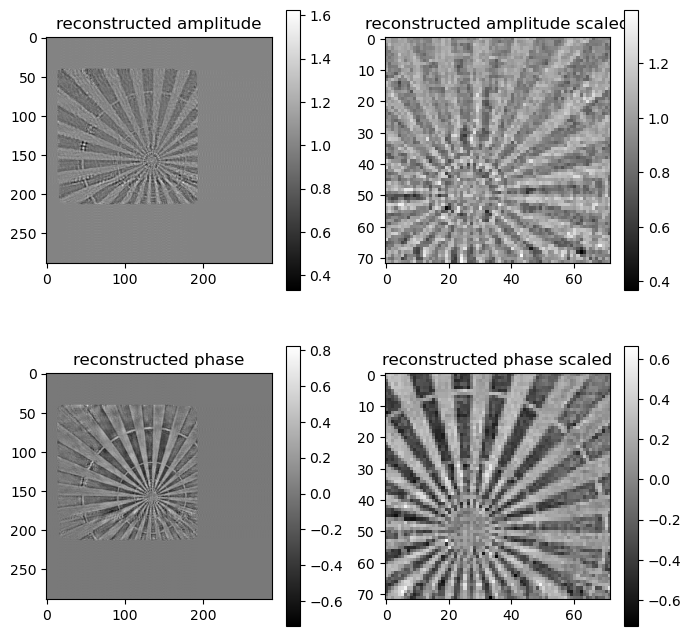

352) gammapsi=1, err=2.50792e+07
352) gammaprb=0.25, err=2.50720e+07


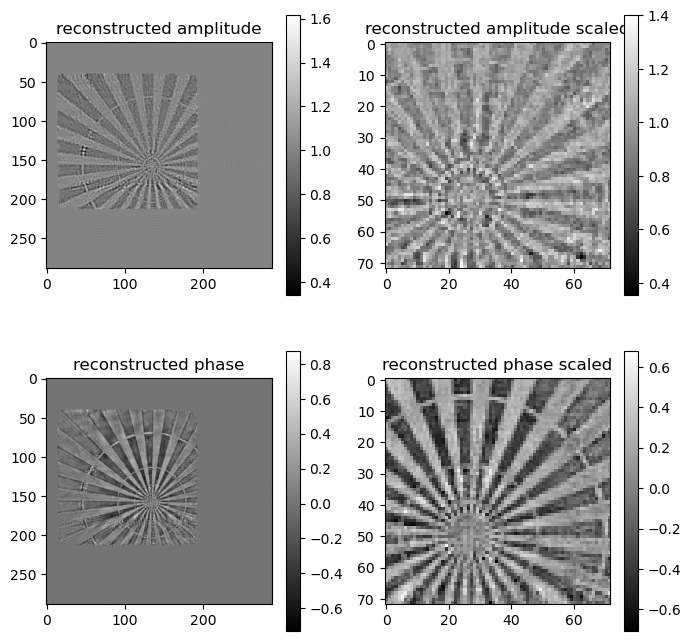

384) gammapsi=1, err=2.47338e+07
384) gammaprb=0.25, err=2.47268e+07


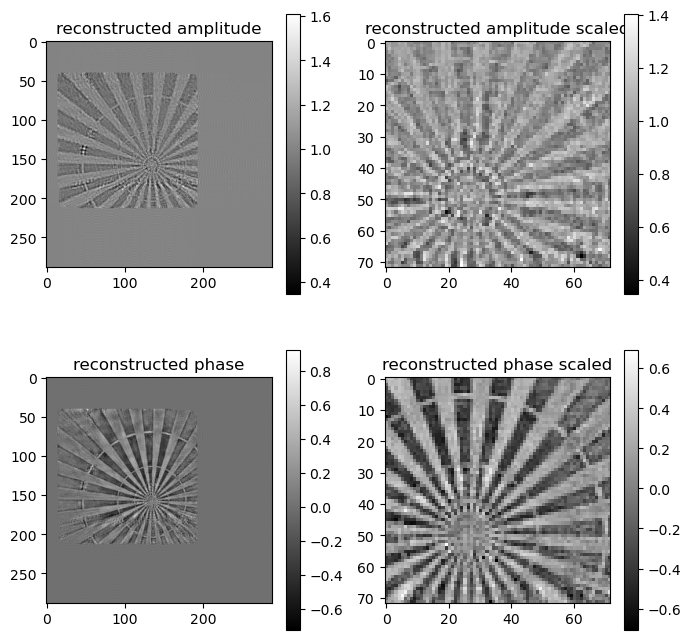

416) gammapsi=0.5, err=2.44308e+07
416) gammaprb=0.25, err=2.44233e+07


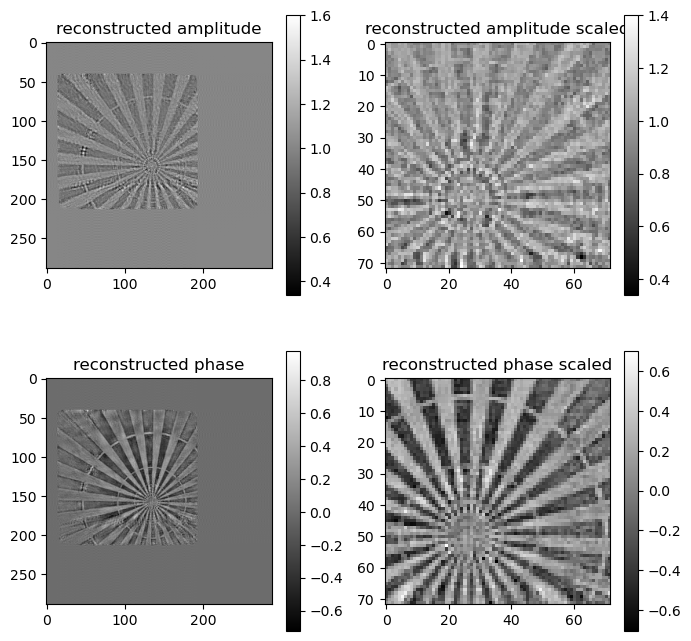

448) gammapsi=1, err=2.41572e+07
448) gammaprb=0.25, err=2.41490e+07


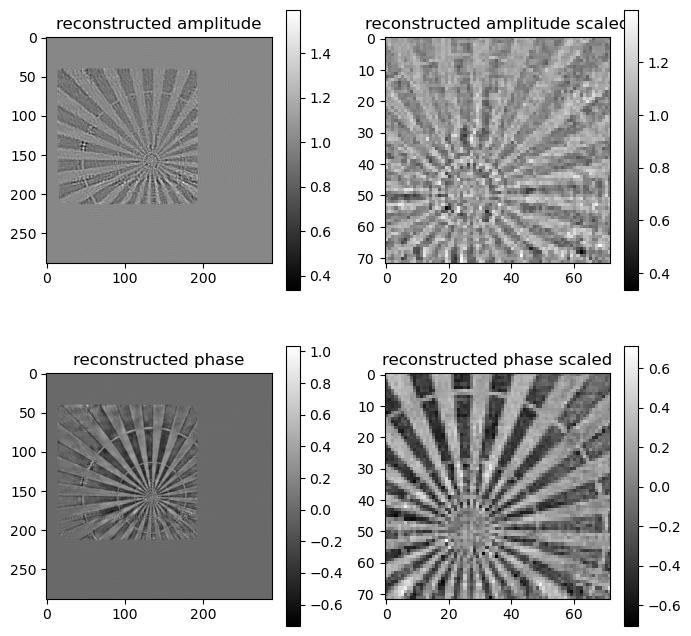

480) gammapsi=0.5, err=2.39065e+07
480) gammaprb=0.25, err=2.39002e+07


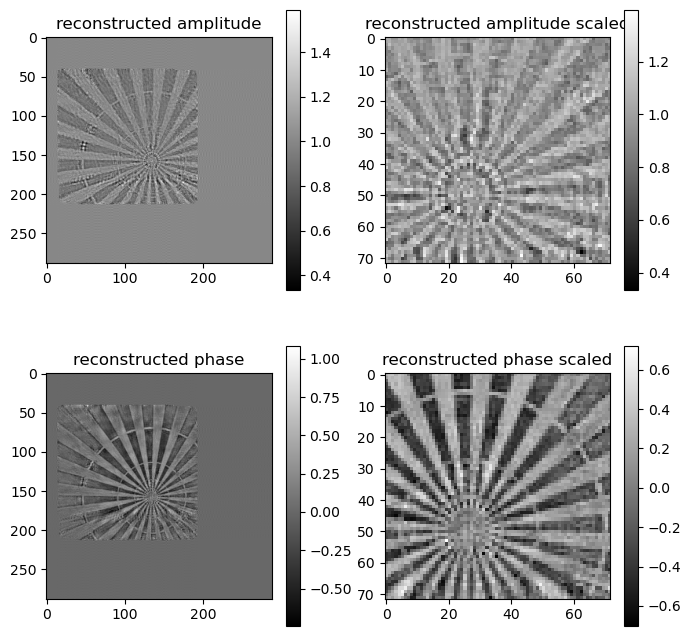

512) gammapsi=0.25, err=2.36851e+07
512) gammaprb=0.5, err=2.36826e+07


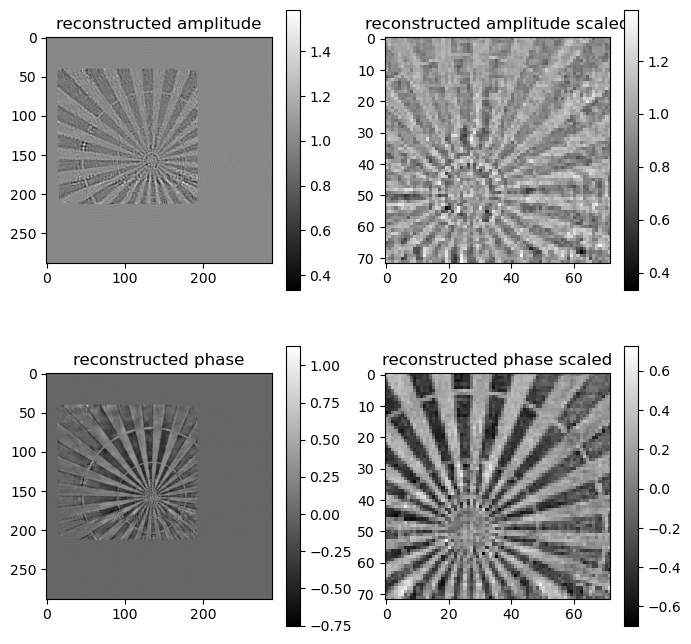

544) gammapsi=0.5, err=2.34907e+07
544) gammaprb=0.25, err=2.34844e+07


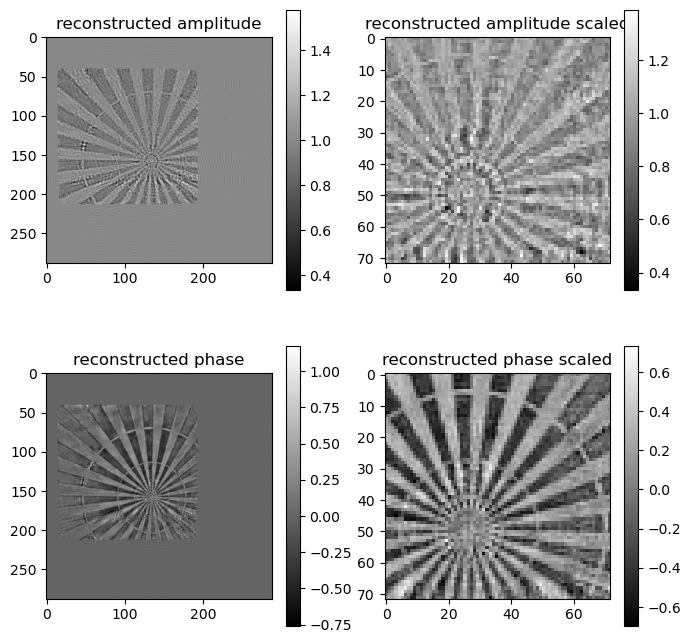

576) gammapsi=0.5, err=2.33049e+07
576) gammaprb=0.25, err=2.32993e+07


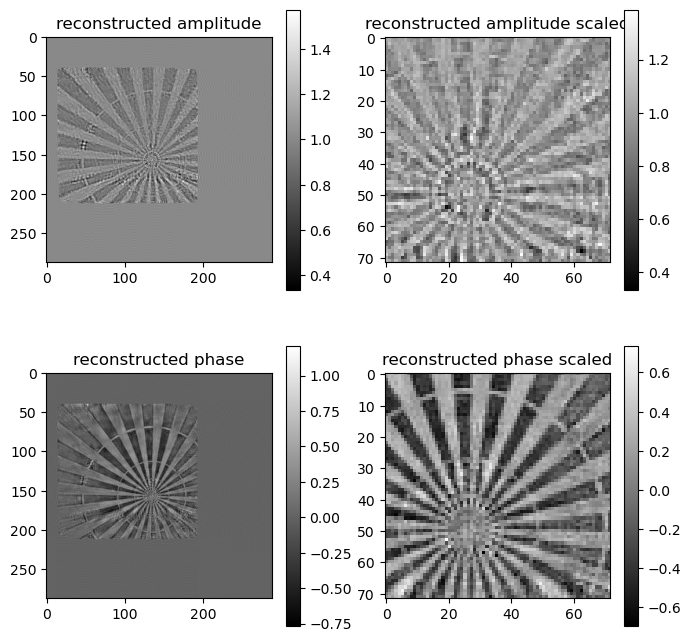

608) gammapsi=0.25, err=2.31340e+07
608) gammaprb=0.25, err=2.31302e+07


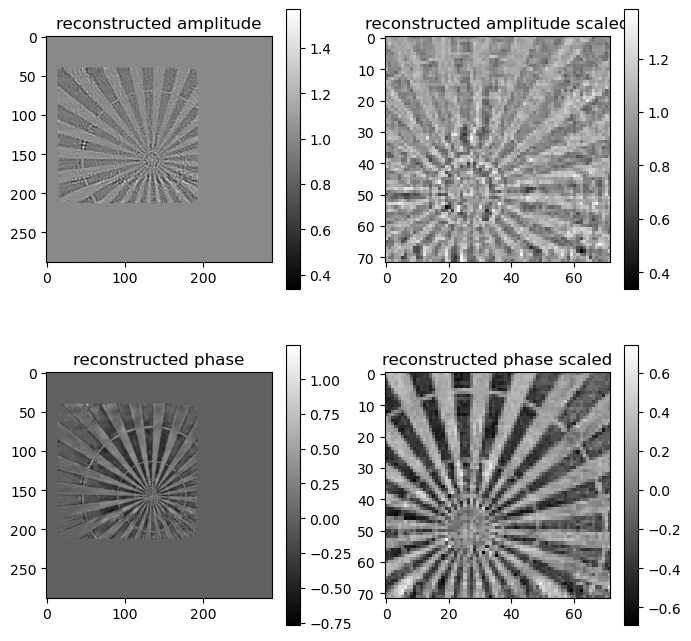

640) gammapsi=0.5, err=2.29785e+07
640) gammaprb=0.25, err=2.29750e+07


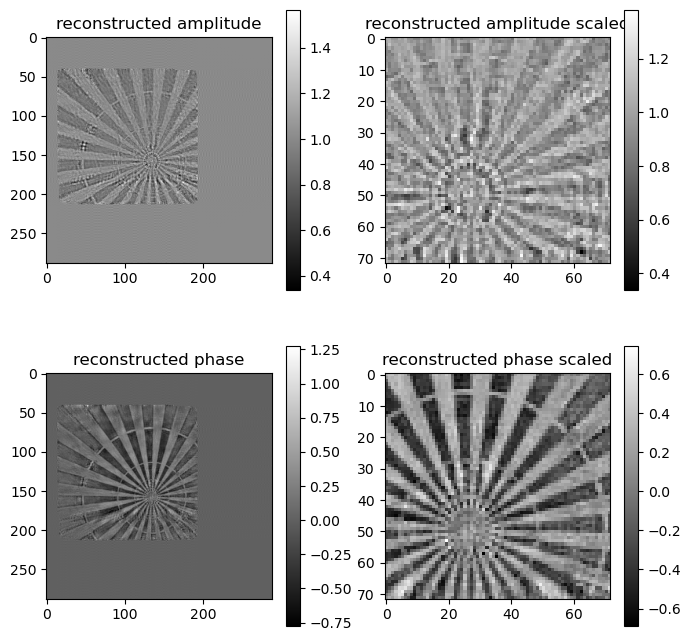

672) gammapsi=0.5, err=2.28315e+07
672) gammaprb=0.25, err=2.28275e+07


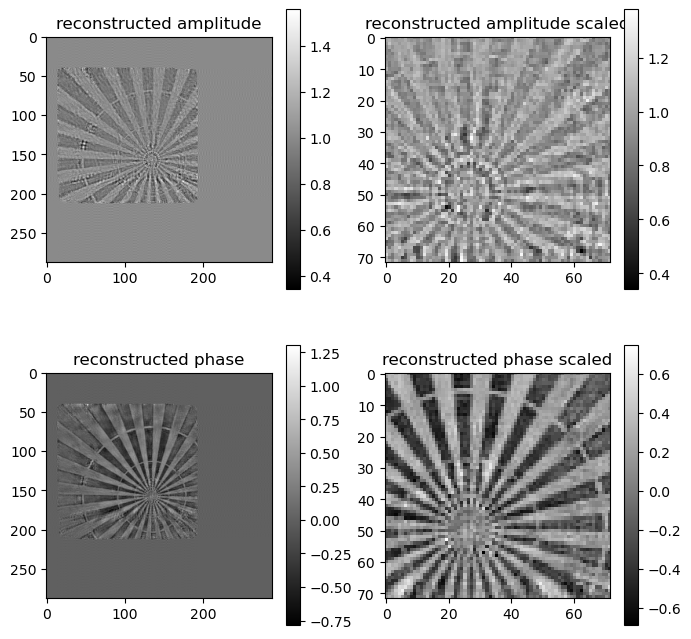

704) gammapsi=0.5, err=2.26879e+07
704) gammaprb=0.25, err=2.26844e+07


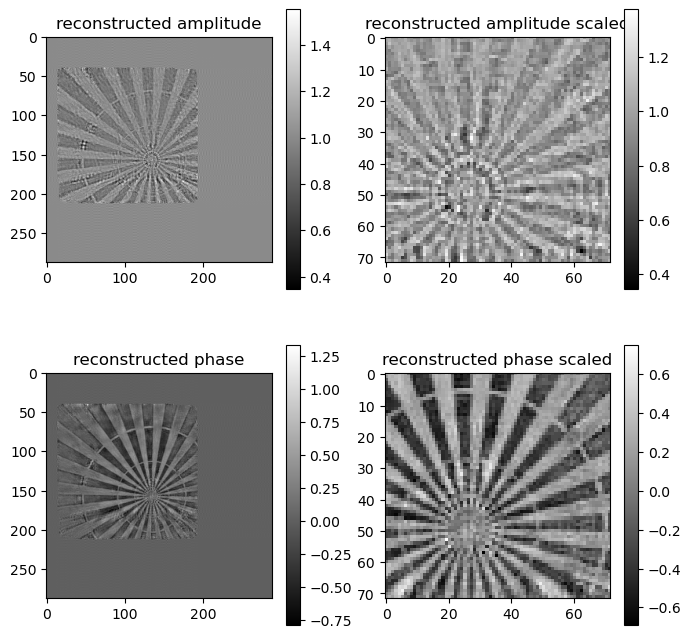

736) gammapsi=0.5, err=2.25565e+07
736) gammaprb=0.25, err=2.25531e+07


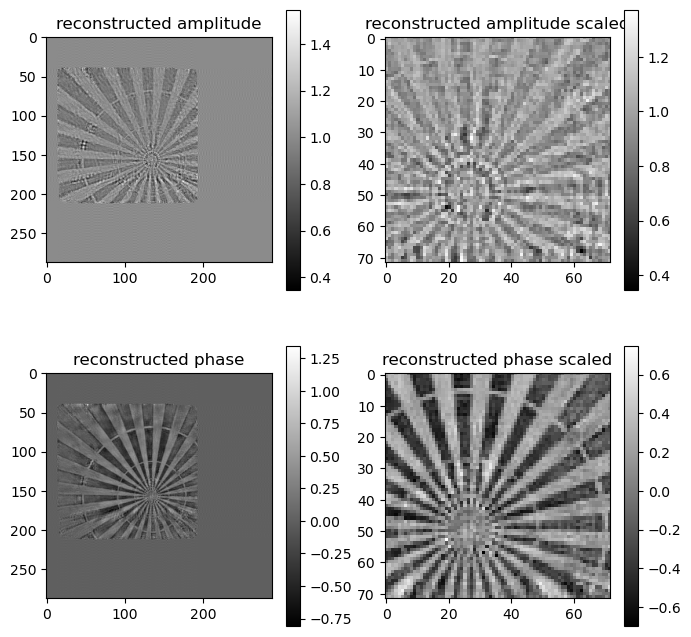

768) gammapsi=0.5, err=2.24308e+07
768) gammaprb=0.25, err=2.24279e+07


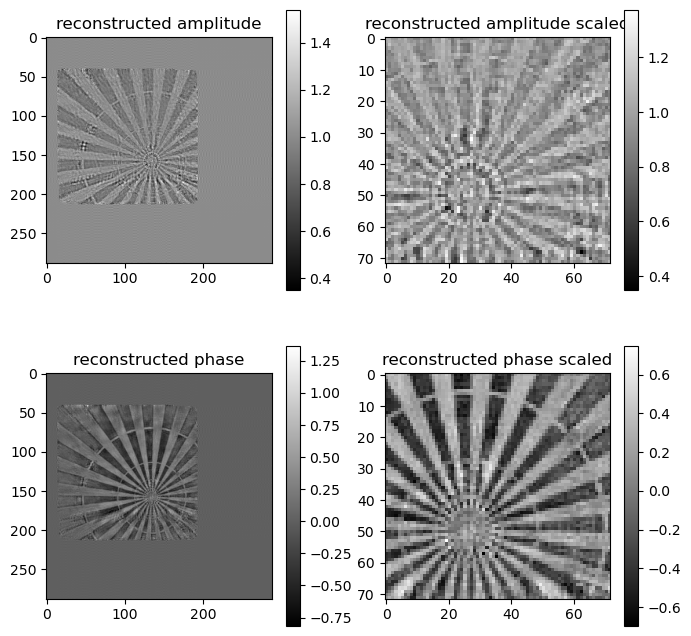

800) gammapsi=1, err=2.23104e+07
800) gammaprb=0.25, err=2.23077e+07


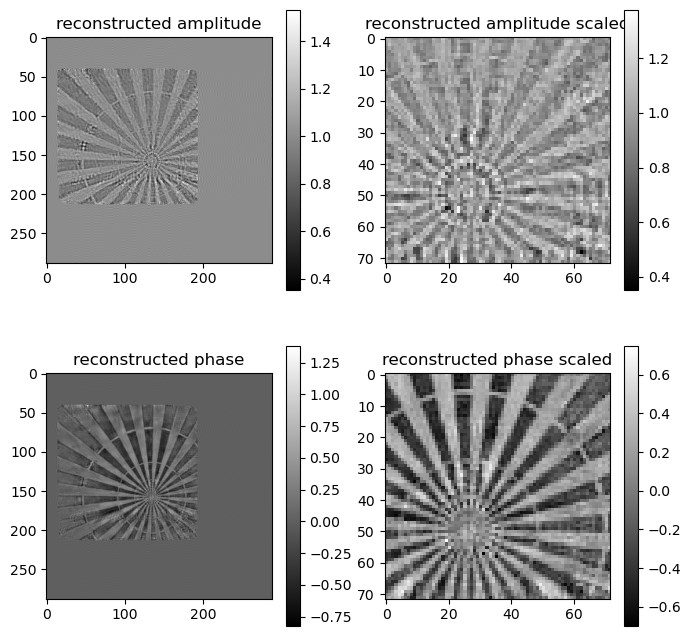

832) gammapsi=0.5, err=2.21972e+07
832) gammaprb=0.25, err=2.21947e+07


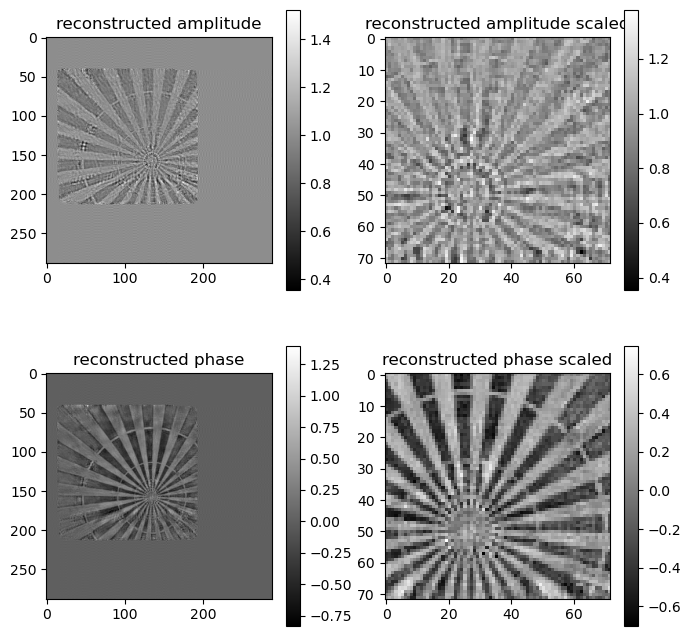

864) gammapsi=0.5, err=2.20901e+07
864) gammaprb=0.25, err=2.20876e+07


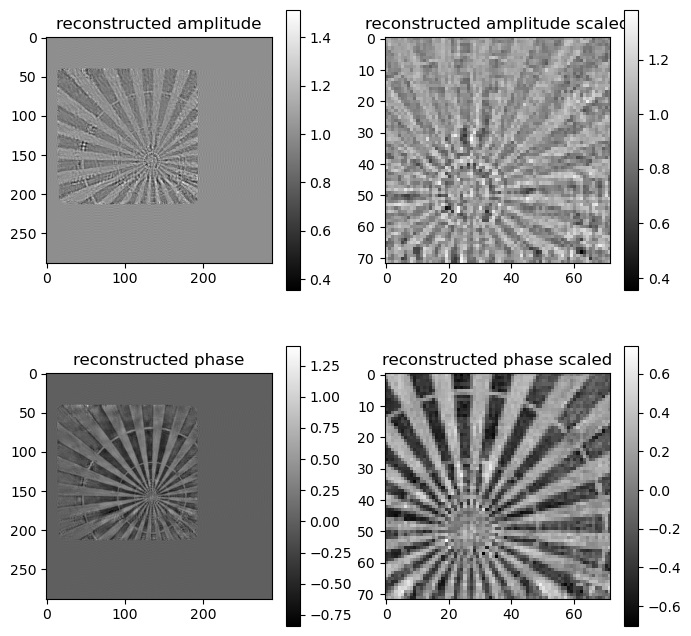

896) gammapsi=0.5, err=2.19867e+07
896) gammaprb=0.25, err=2.19842e+07


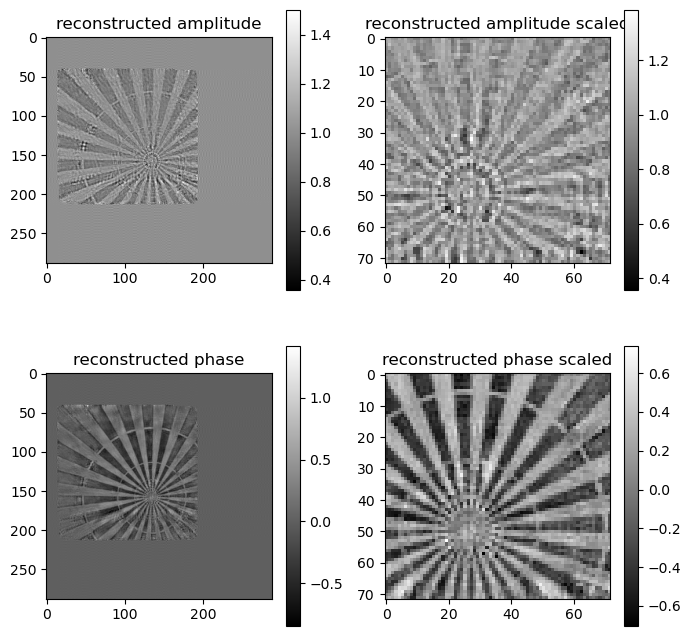

928) gammapsi=0.5, err=2.18865e+07
928) gammaprb=0.25, err=2.18843e+07


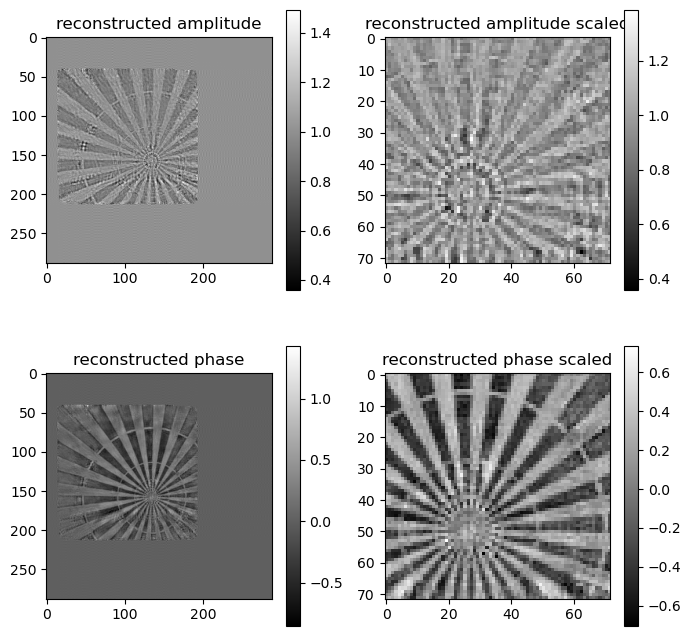

960) gammapsi=0.5, err=2.17948e+07
960) gammaprb=0.25, err=2.17928e+07


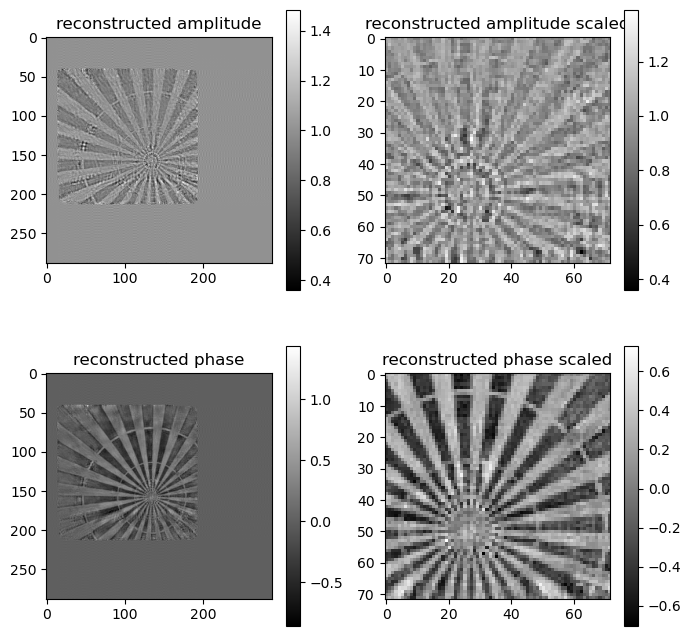

992) gammapsi=0.25, err=2.17000e+07
992) gammaprb=1, err=2.16929e+07


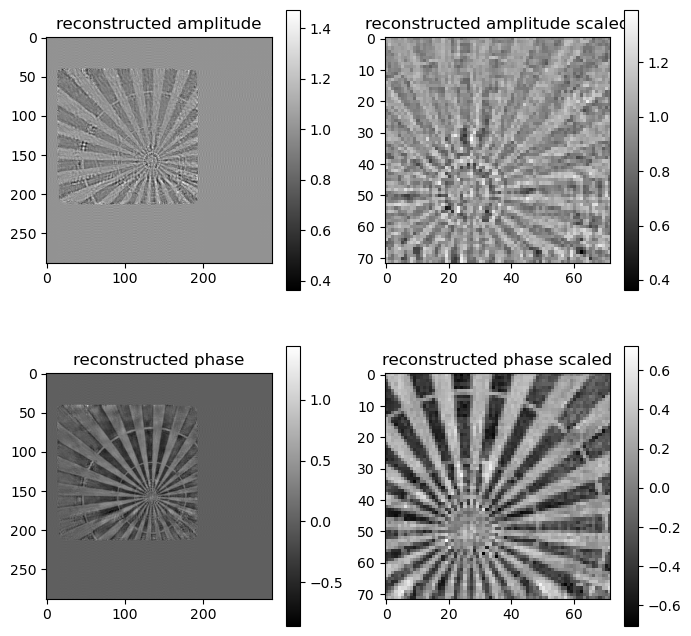

1024) gammapsi=0.25, err=2.16059e+07
1024) gammaprb=1, err=2.15998e+07


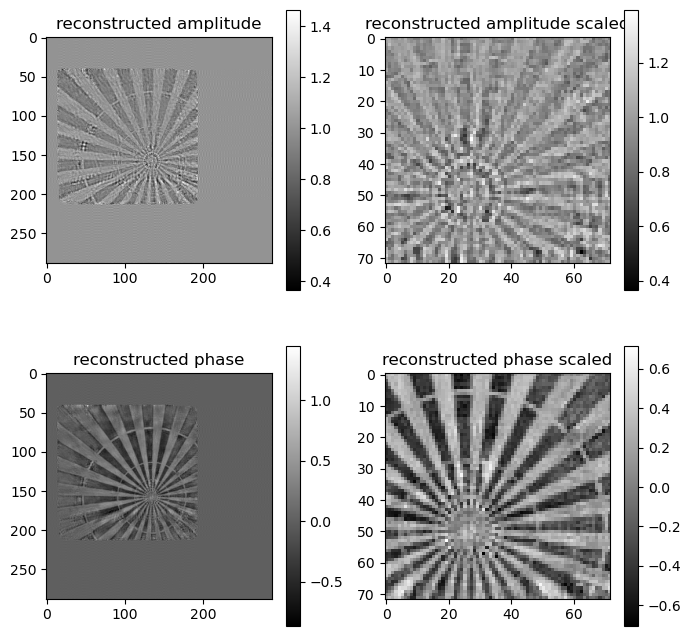

1056) gammapsi=0.5, err=2.15102e+07
1056) gammaprb=1, err=2.15051e+07


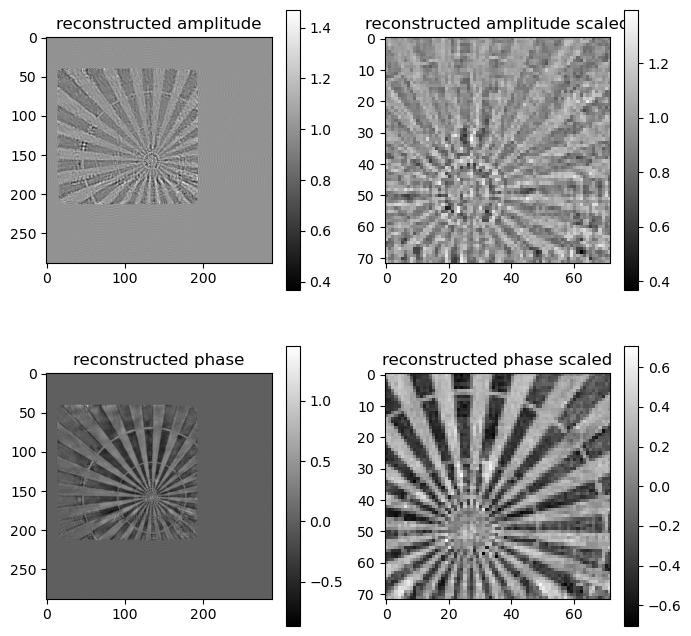

1088) gammapsi=0.5, err=2.14133e+07
1088) gammaprb=0.25, err=2.14112e+07


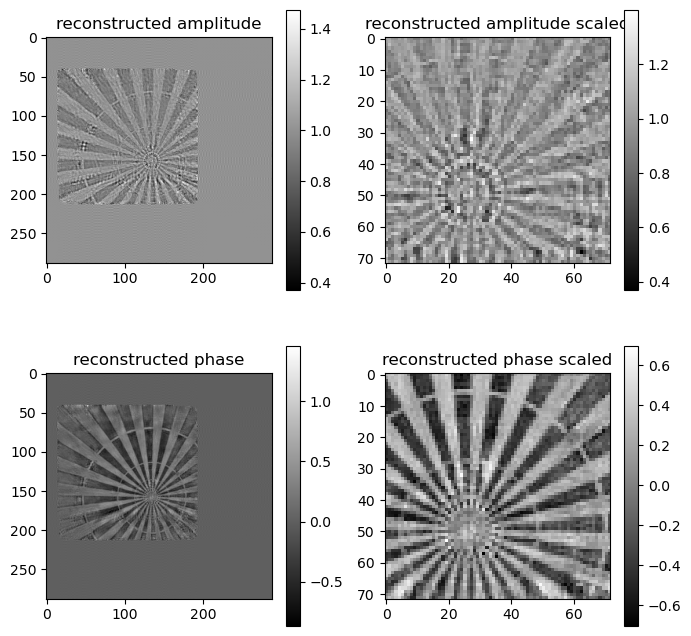

1120) gammapsi=0.5, err=2.13308e+07
1120) gammaprb=0.25, err=2.13295e+07


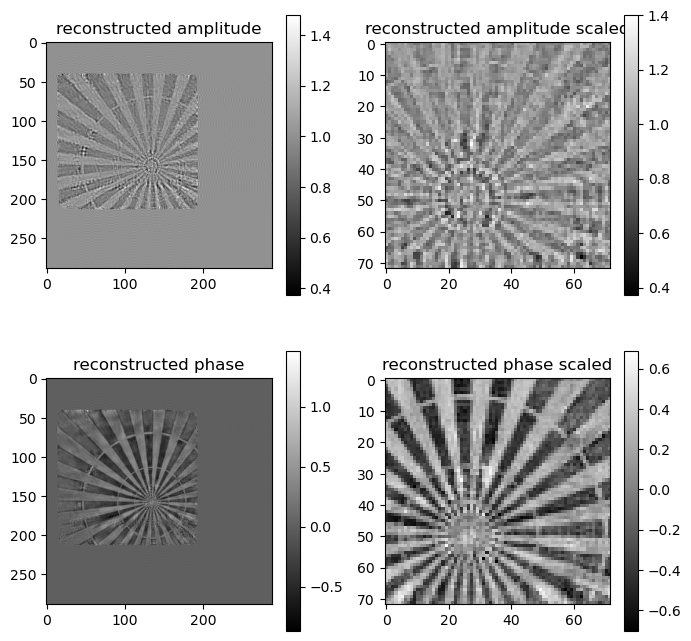

1152) gammapsi=0.5, err=2.12493e+07
1152) gammaprb=0.25, err=2.12478e+07


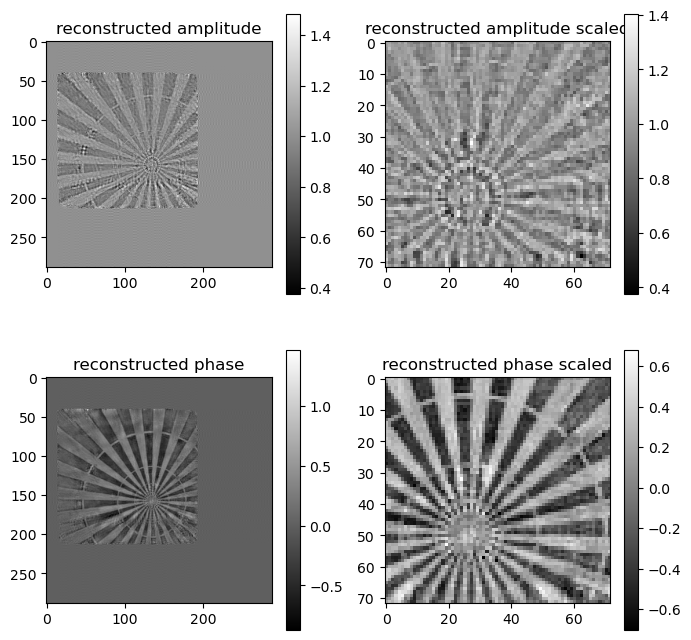

1184) gammapsi=0.5, err=2.11986e+07
1184) gammaprb=0.25, err=2.11977e+07


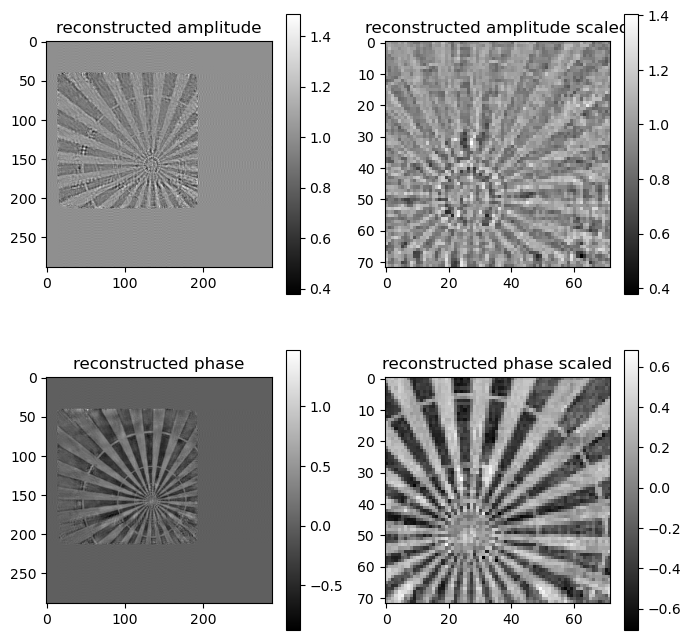

1216) gammapsi=0.5, err=2.11287e+07
1216) gammaprb=0.25, err=2.11265e+07


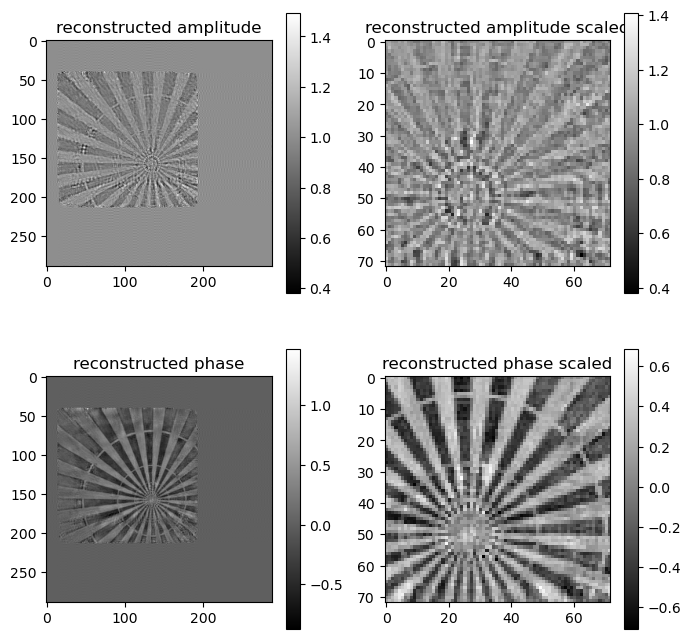

1248) gammapsi=0.5, err=2.10389e+07
1248) gammaprb=0.25, err=2.10367e+07


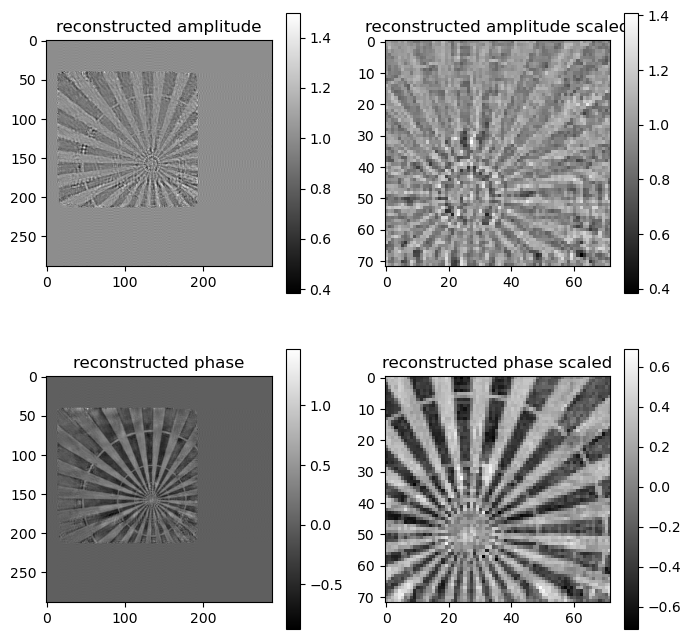

1280) gammapsi=0.5, err=2.09608e+07
1280) gammaprb=0.25, err=2.09589e+07


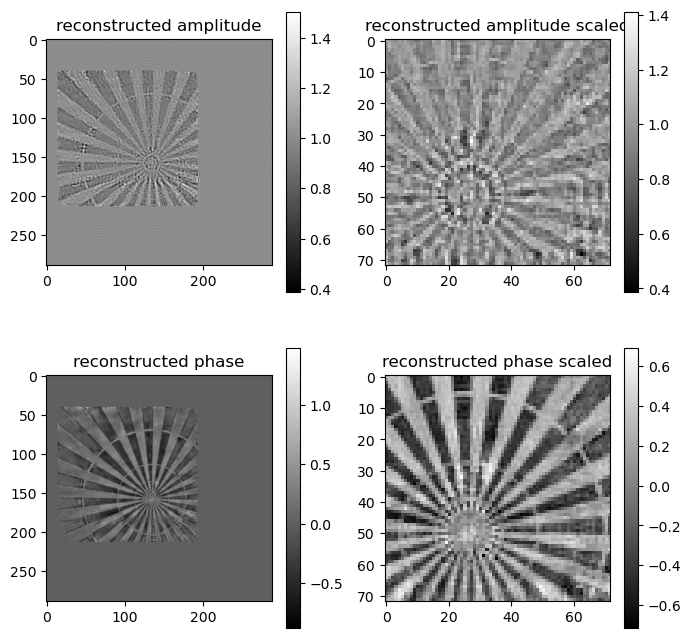

1312) gammapsi=0.5, err=2.08925e+07
1312) gammaprb=0.25, err=2.08906e+07


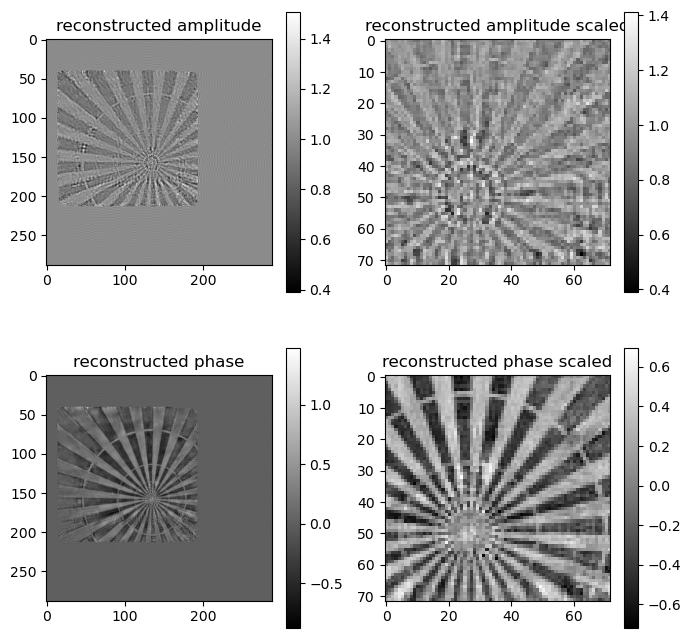

1344) gammapsi=1, err=2.08241e+07
1344) gammaprb=0.25, err=2.08224e+07


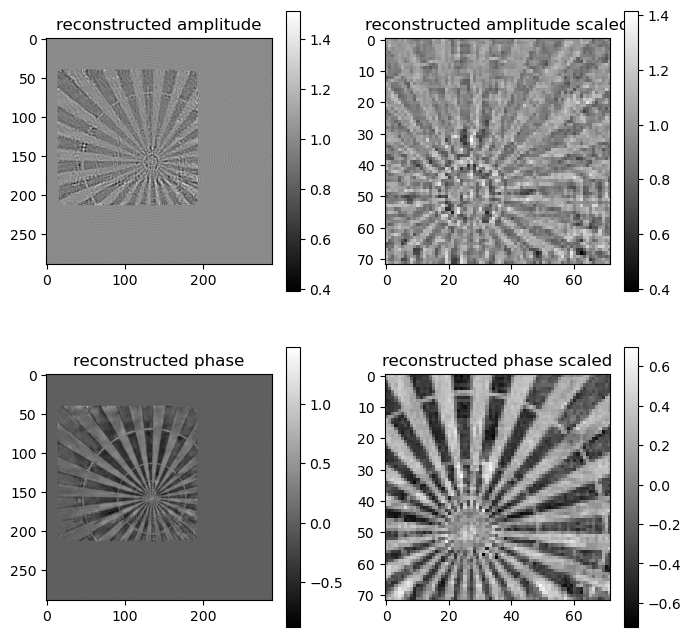

1376) gammapsi=0.5, err=2.07579e+07
1376) gammaprb=0.25, err=2.07563e+07


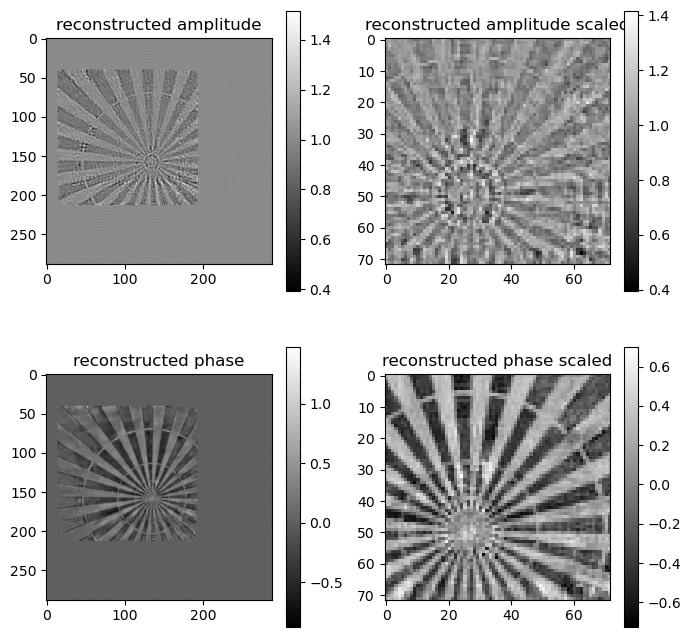

1408) gammapsi=0.5, err=2.06941e+07
1408) gammaprb=0.25, err=2.06922e+07


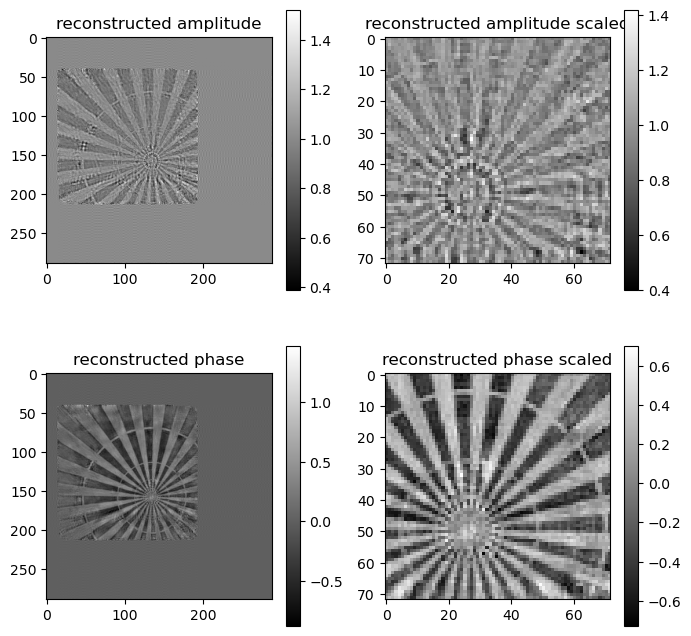

1440) gammapsi=0.5, err=2.06296e+07
1440) gammaprb=0.25, err=2.06278e+07


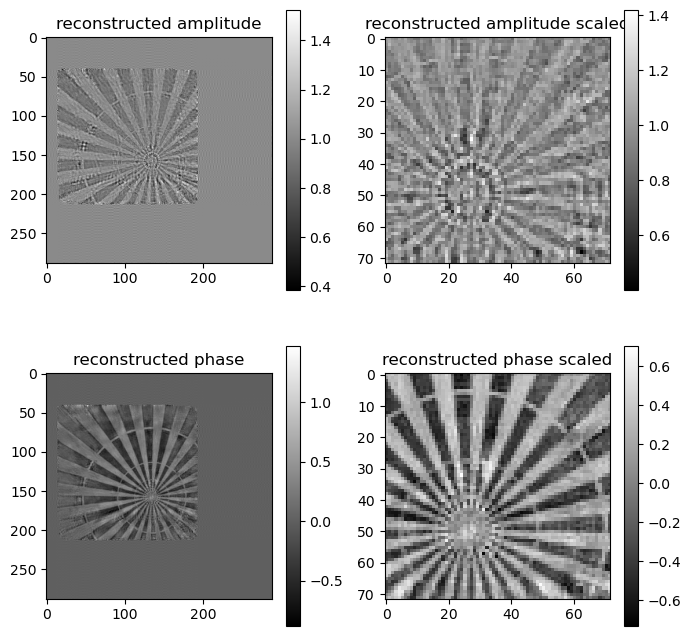

1472) gammapsi=0.5, err=2.05663e+07
1472) gammaprb=0.25, err=2.05647e+07


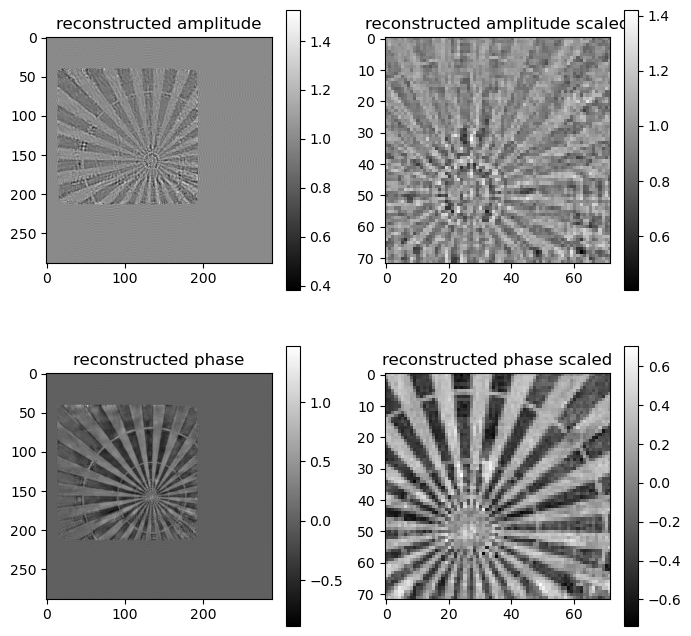

1504) gammapsi=0.5, err=2.05055e+07
1504) gammaprb=0.5, err=2.05053e+07


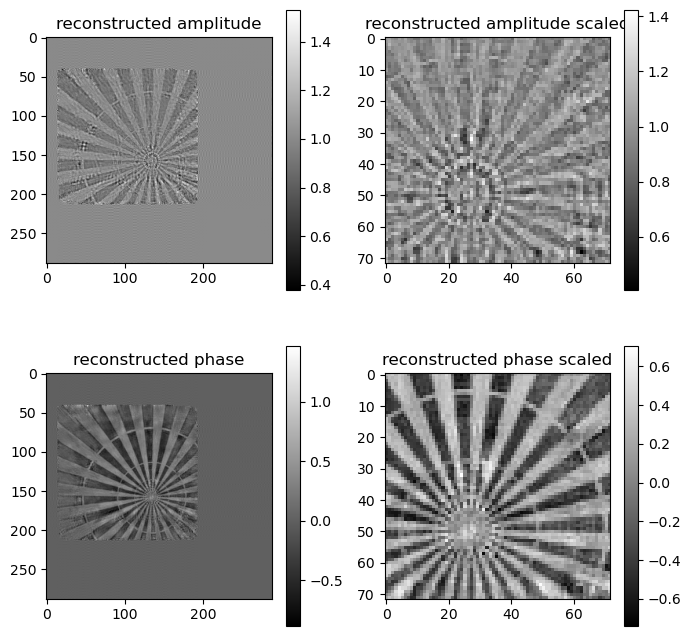

1536) gammapsi=0.5, err=2.04439e+07
1536) gammaprb=0.25, err=2.04425e+07


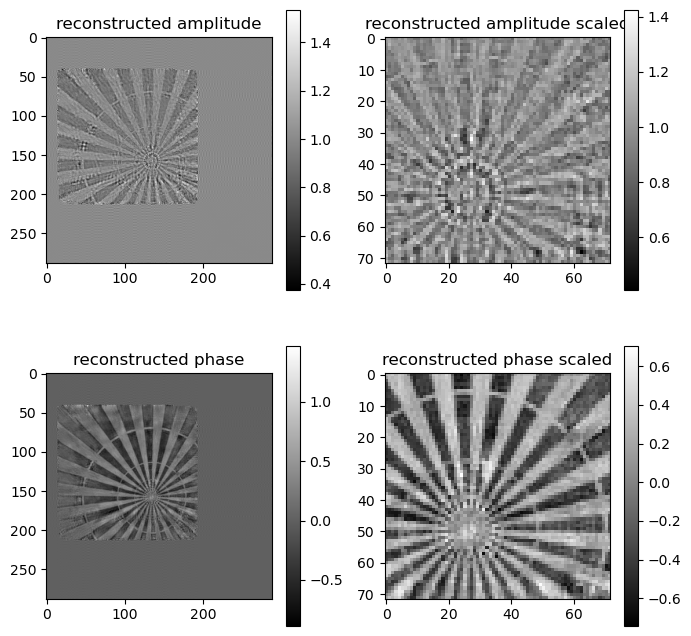

1568) gammapsi=0.5, err=2.03858e+07
1568) gammaprb=0.25, err=2.03844e+07


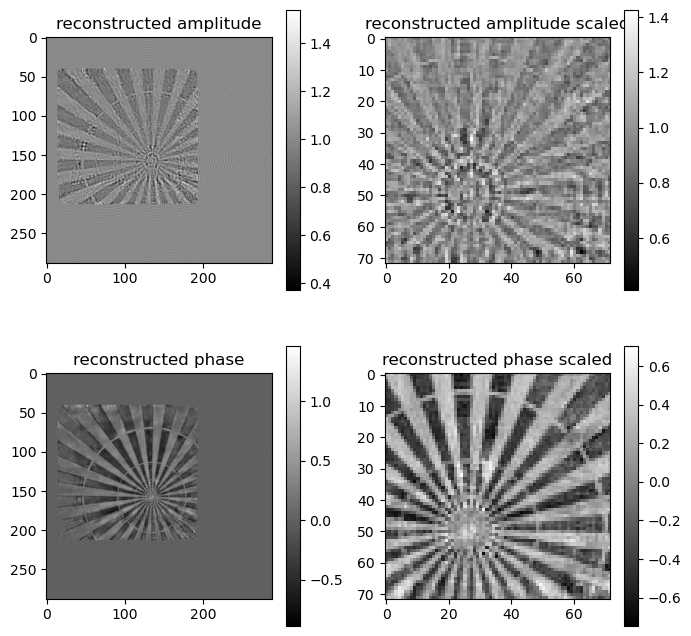

1600) gammapsi=0.5, err=2.03267e+07
1600) gammaprb=0.25, err=2.03250e+07


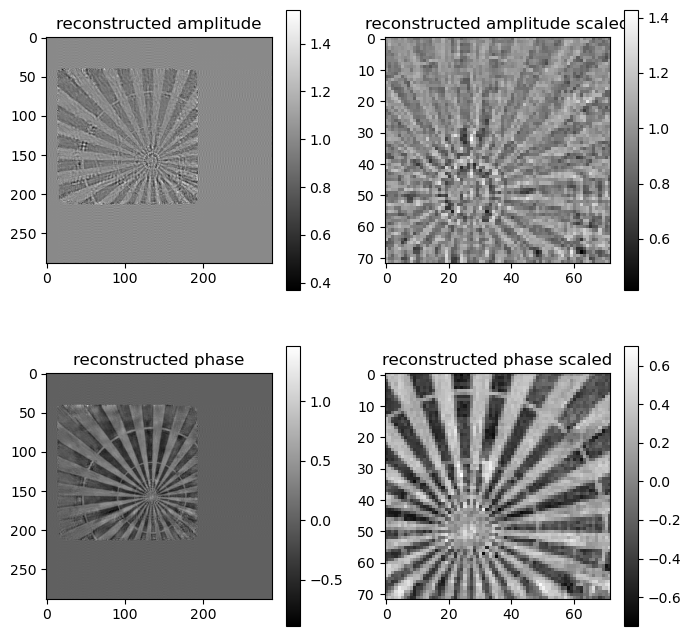

1632) gammapsi=1, err=2.02683e+07
1632) gammaprb=0.25, err=2.02670e+07


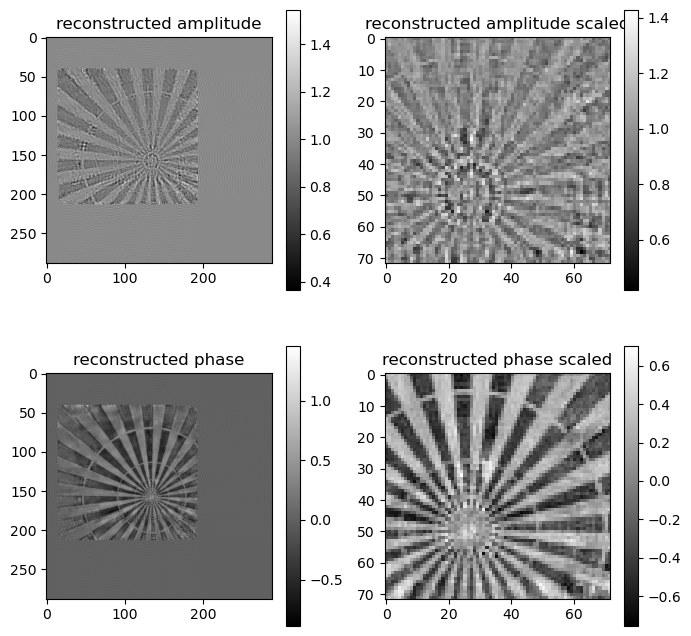

1664) gammapsi=0.5, err=2.02088e+07
1664) gammaprb=0.25, err=2.02074e+07


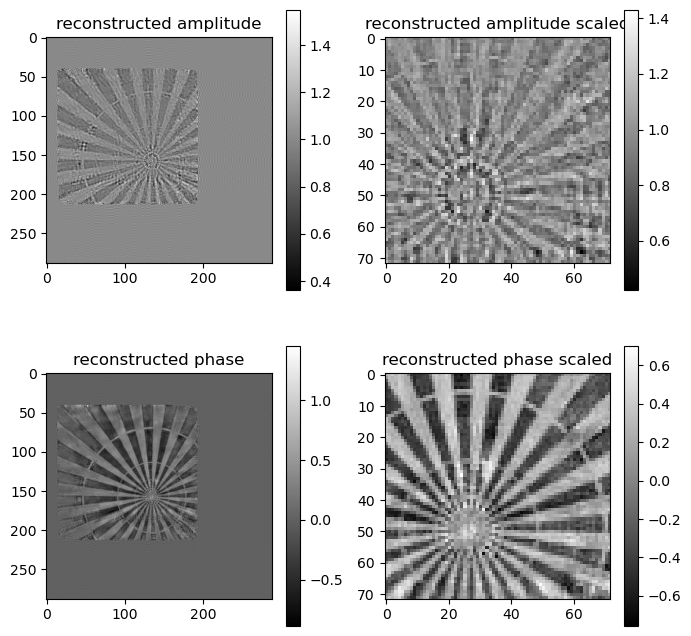

1696) gammapsi=0.5, err=2.01516e+07
1696) gammaprb=0.25, err=2.01502e+07


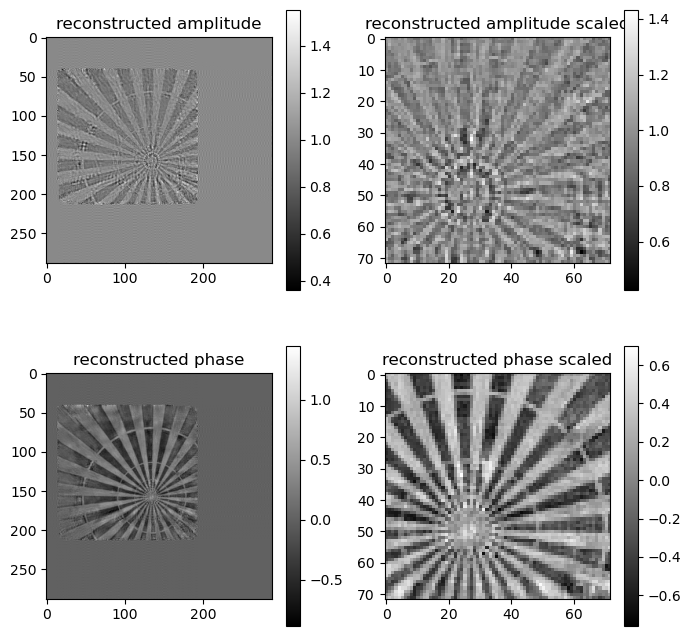

1728) gammapsi=1, err=2.00920e+07
1728) gammaprb=0.25, err=2.00903e+07


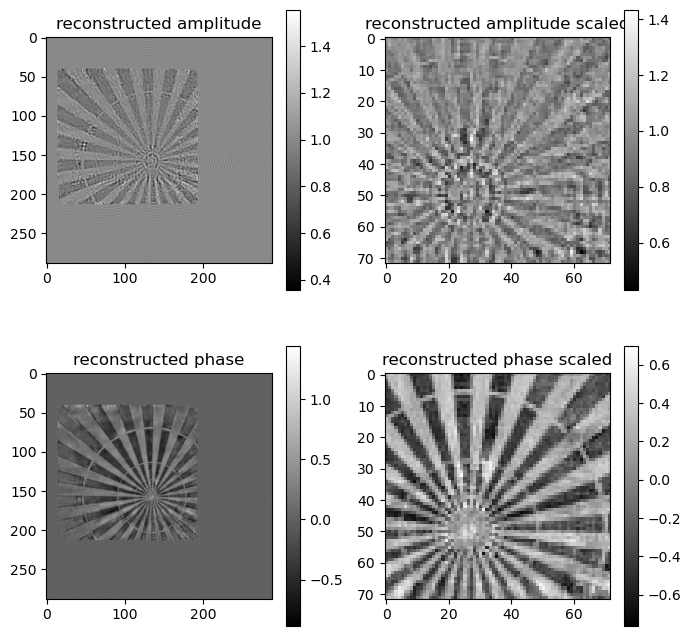

1760) gammapsi=0.5, err=2.00328e+07
1760) gammaprb=0.5, err=2.00324e+07


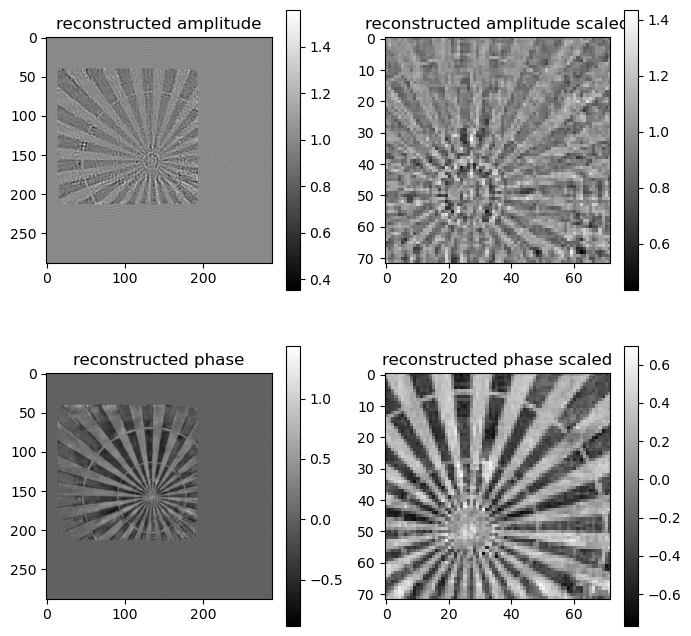

1792) gammapsi=0.25, err=1.99735e+07
1792) gammaprb=0.25, err=1.99721e+07


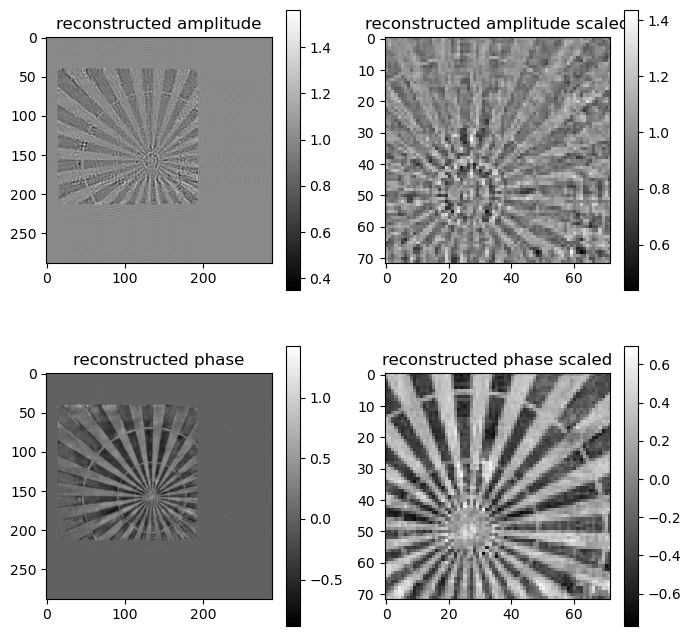

1824) gammapsi=0.5, err=1.99154e+07
1824) gammaprb=0.5, err=1.99151e+07


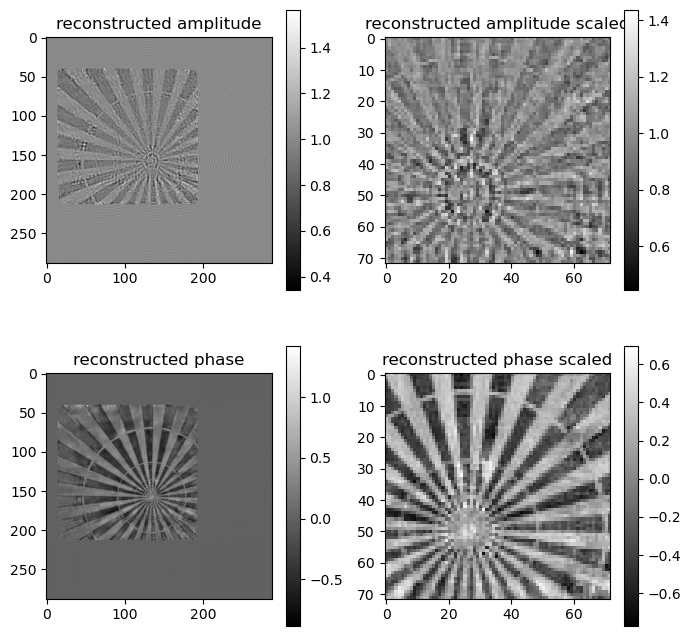

1856) gammapsi=0.5, err=1.98544e+07
1856) gammaprb=0.25, err=1.98527e+07


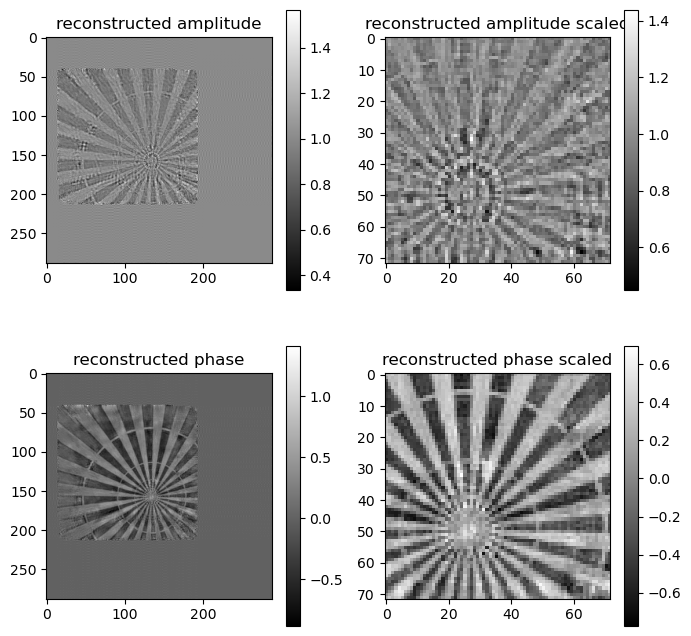

1888) gammapsi=0.25, err=1.97950e+07
1888) gammaprb=0.5, err=1.97944e+07


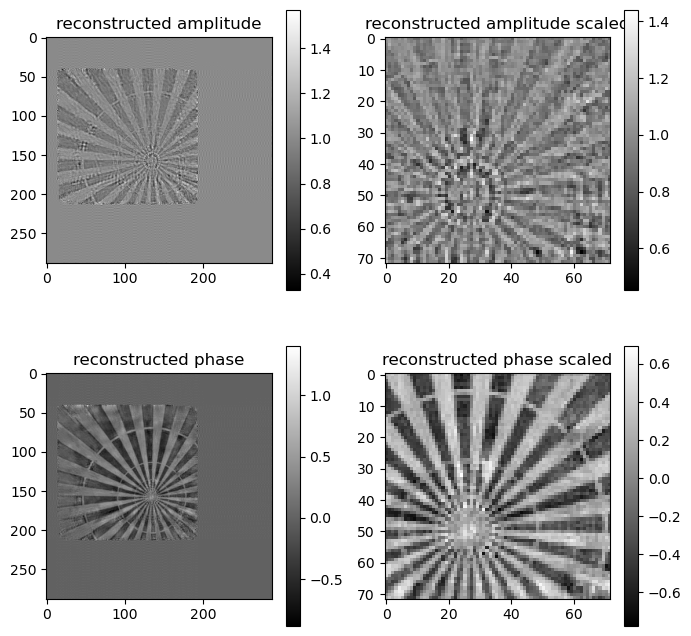

1920) gammapsi=0.5, err=1.97384e+07
1920) gammaprb=0.5, err=1.97383e+07


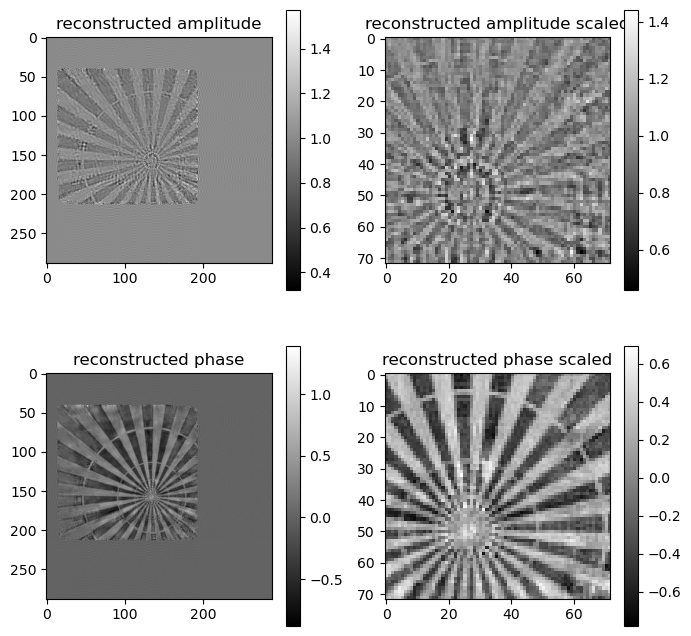

1952) gammapsi=0.5, err=1.96833e+07
1952) gammaprb=0.5, err=1.96831e+07


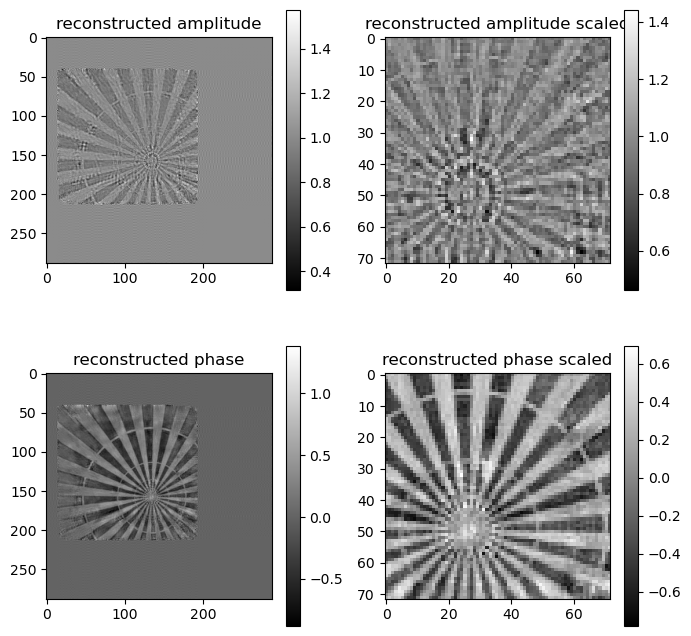

1984) gammapsi=0.5, err=1.96305e+07
1984) gammaprb=0.25, err=1.96282e+07


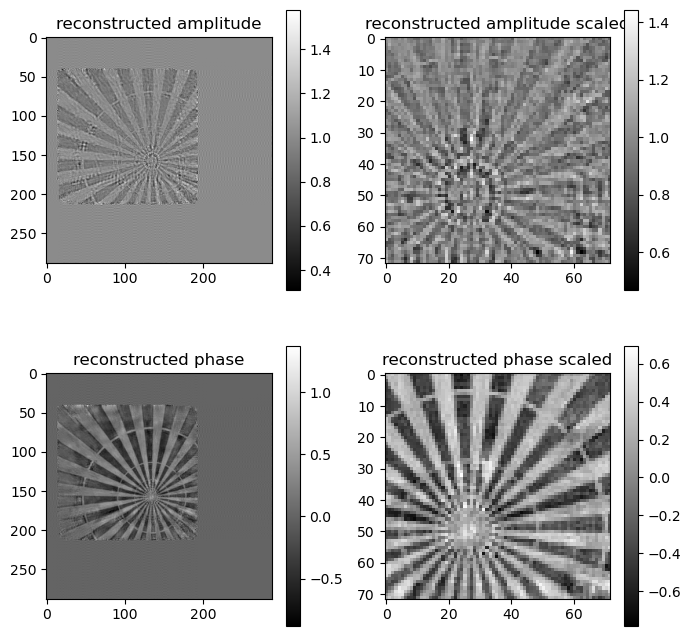

2016) gammapsi=0.5, err=1.95765e+07
2016) gammaprb=0.25, err=1.95752e+07


In [106]:
shifts_rec = cp.array(shifts_new)
rec = np.ones([1,2*n,2*n],dtype='complex64')
# use only the abs value of the probe as initial guess
rec_prb[:] = rec_prb0

pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances, norm_magnifications) 
rec,rec_prb = cg_holo_batch(pslv, data, rec, rec_prb, 2048, shifts_rec, True,True,32)